<p style="color:rgb(0, 0, 255); line-height: 1.6;"><b>This dataset is related to Dry Eye disease analysis. The goal is to predict or analyze factors influencing Dry Eye conditions for a given population . The dataset includes patient-related features, test results, or environmental factors contributing to Dry Eye disease.</b></p>

<p>
<b>Gender</b> – Categorical (e.g., Male, Female)

<b>Age</b> – Numeric (Integer)

<b>Sleep duration</b> – Numeric (Float, likely in hours)

<b>Sleep quality</b> – Numeric (Integer scale, e.g., 1–10)

<b>Stress level</b> – Numeric (Integer scale)

<b>Blood pressure</b> – Categorical (e.g., "120/80")

<b>Heart rate</b> – Numeric (Integer, beats per minute)

<b>Daily steps</b> – Numeric (Integer)

<b>Physical activity</b> – Numeric (Integer, possibly minutes/day or activity level)

<b>Height</b> – Numeric (Integer, likely in cm)

<b>Weight</b> – Numeric (Integer, likely in kg)

<b>Sleep disorder</b> – Categorical (e.g., Yes/No or disorder types)

<b>Wake up during night</b> – Categorical (Yes/No)

<b>Feel sleepy during day</b> – Categorical (Yes/No)

<b>Caffeine consumption</b> – Categorical (e.g., Yes/No or levels)

<b>Alcohol consumption</b> – Categorical

<b>Smoking – Categorical</b>

<b>Medical issue</b> – Categorical (e.g., Yes/No)

<b>Ongoing medication</b> – Categorical

<b>Smart device before bed</b> – Categorical (e.g., Yes/No)

<b>Average screen time</b> – Numeric (Float, likely in hours/day)

<b>Blue-light filter</b> – Categorical (Yes/No)

<b>Discomfort Eye-strain</b> – Categorical (Yes/No)

<b>Redness in eye</b> – Categorical

<b>Itchiness/Irritation in eye</b> – Categorical

<b>Dry Eye Disease</b> – Categorical (Target variable: Yes/No or diagnosis)
</p>

In [2165]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from sklearn.metrics import accuracy_score,recall_score,f1_score,precision_score,roc_auc_score,classification_report,roc_curve,confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import precision_recall_curve, average_precision_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier,AdaBoostClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.feature_selection import RFE
import warnings
warnings.filterwarnings('ignore')

In [2166]:
pd.set_option('display.max_columns', None)

In [2167]:
df=pd.read_csv('Dry_Eye_Dataset.csv')

In [2168]:
df.head()

,Gender,Age,Sleep duration,Sleep quality,Stress level,Blood pressure,Heart rate,Daily steps,Physical activity,Height,Weight,Sleep disorder,Wake up during night,Feel sleepy during day,Caffeine consumption,Alcohol consumption,Smoking,Medical issue,Ongoing medication,Smart device before bed,Average screen time,Blue-light filter,Discomfort Eye-strain,Redness in eye,Itchiness/Irritation in eye,Dry Eye Disease
0,F,24,9.5,2,1,137/89,67,3000,31,161,69,Y,N,N,N,N,N,Y,Y,N,8.7,N,Y,Y,N,Y
1,M,39,9.6,2,3,108/64,60,12000,74,164,87,N,N,N,N,Y,N,Y,Y,N,9.6,Y,N,N,Y,Y
2,F,45,5.4,1,5,134/81,95,12000,93,179,94,Y,Y,N,Y,Y,N,N,N,Y,4.0,N,Y,N,N,N
3,F,45,5.4,4,5,110/90,78,19000,32,160,77,N,N,N,Y,N,N,Y,N,N,7.6,N,Y,N,Y,N
4,F,42,5.7,3,2,99/67,72,4000,173,179,99,N,Y,N,N,N,N,Y,N,N,3.5,N,Y,Y,N,Y


In [2169]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 26 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Gender                       20000 non-null  object 
 1   Age                          20000 non-null  int64  
 2   Sleep duration               20000 non-null  float64
 3   Sleep quality                20000 non-null  int64  
 4   Stress level                 20000 non-null  int64  
 5   Blood pressure               20000 non-null  object 
 6   Heart rate                   20000 non-null  int64  
 7   Daily steps                  20000 non-null  int64  
 8   Physical activity            20000 non-null  int64  
 9   Height                       20000 non-null  int64  
 10  Weight                       20000 non-null  int64  
 11  Sleep disorder               20000 non-null  object 
 12  Wake up during night         20000 non-null  object 
 13  Feel sleepy duri

# Checking for duplicate values

In [2175]:
df.duplicated().sum()

0

<p style="color:rgb(0, 0, 255);>No missing values found</p> 

# Checking for missing values

In [2180]:
# Missing Values
missing_values = df.isnull().sum()
missing_percentage = (missing_values / len(df)) * 100
print("\nMissing Value Percentage:")
print(missing_percentage)


Missing Value Percentage:
Gender                         0.0
Age                            0.0
Sleep duration                 0.0
Sleep quality                  0.0
Stress level                   0.0
Blood pressure                 0.0
Heart rate                     0.0
Daily steps                    0.0
Physical activity              0.0
Height                         0.0
Weight                         0.0
Sleep disorder                 0.0
Wake up during night           0.0
Feel sleepy during day         0.0
Caffeine consumption           0.0
Alcohol consumption            0.0
Smoking                        0.0
Medical issue                  0.0
Ongoing medication             0.0
Smart device before bed        0.0
Average screen time            0.0
Blue-light filter              0.0
Discomfort Eye-strain          0.0
Redness in eye                 0.0
Itchiness/Irritation in eye    0.0
Dry Eye Disease                0.0
dtype: float64


# Statistical Summary

In [2183]:
df.describe()

,Age,Sleep duration,Sleep quality,Stress level,Heart rate,Daily steps,Physical activity,Height,Weight,Average screen time
count,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000
mean,31.422800,6.998245,2.997250,2.993750,79.912200,10536.900000,90.069750,174.865900,74.891850,5.519885
std,8.103717,1.731723,1.412283,1.407235,11.808279,5752.729186,52.317283,14.719903,14.733839,2.606305
min,18.000000,4.000000,1.000000,1.000000,60.000000,1000.000000,0.000000,150.000000,50.000000,1.000000
25%,24.000000,5.500000,2.000000,2.000000,70.000000,6000.000000,45.000000,162.000000,62.000000,3.300000
50%,31.000000,7.000000,3.000000,3.000000,80.000000,11000.000000,91.000000,175.000000,75.000000,5.500000
75%,39.000000,8.500000,4.000000,4.000000,90.000000,16000.000000,135.000000,188.000000,88.000000,7.800000
max,45.000000,10.000000,5.000000,5.000000,100.000000,20000.000000,180.000000,200.000000,100.000000,10.000000


 <p>
     1.<b>Age:</b>This is a relatively young to middle-aged population.The narrow age range may affect generalizability to older adults or children.</p>
 <p>2.<b>Sleep duration:</b>On average, participants meet recommended sleep duration (7–9 hrs). However, a significant portion sleeps below that threshold  (min = 4),which may affect health and screen-time related disorders.</p>
 <p>3.<b>Sleep quality:</b>Normal distribution centered at moderate sleep quality. There’s noticeable variance, suggesting some individuals experience poor sleep regularly.</p>
<p> 4.<b>Stress level:</b>stress levels average around medium, with enough spread to detect differences among individuals. This could be a critical feature  when analyzing lifestyle-related conditions.</p>
<p> 5.<b>Heart rate:</b>All within normal resting heart rate range.</p>
<p> 6.<b>Daily steps:</b>Quite active on average — the general guideline is 10,000 steps/day. High variance suggests significant lifestyle differences  (sedentary vs. active users).</p>
<p> 7.<b>Physical activity:</b>On average, people meet the recommended 30 mins/day. But some are completely inactive (0 minutes) — a possible risk factor  for lifestyle diseases.</p>
<p> 8.<b>Height:</b>Represents a fairly typical adult height distribution.</p>
<p> 9:<b>Weight:</b>Standard weight range for adults. </p>
<p> 10.<b>Average Screen Time:</b>High screen time on average — this may correlate strongly with eye strain, dry eye disease (DED), and sleep quality  issues. A key feature</p>


# Checking for anomalies

In [2187]:
for i in df.select_dtypes(include='object').columns:
    print(f'{i}\n',df[i].unique())

Gender
 ['F' 'M']
Blood pressure
 ['137/89' '108/64' '134/81' ... '133/61' '125/72' '114/62']
Sleep disorder
 ['Y' 'N']
Wake up during night
 ['N' 'Y']
Feel sleepy during day
 ['N' 'Y']
Caffeine consumption
 ['N' 'Y']
Alcohol consumption
 ['N' 'Y']
Smoking
 ['N' 'Y']
Medical issue
 ['Y' 'N']
Ongoing medication
 ['Y' 'N']
Smart device before bed
 ['N' 'Y']
Blue-light filter
 ['N' 'Y']
Discomfort Eye-strain
 ['Y' 'N']
Redness in eye
 ['Y' 'N']
Itchiness/Irritation in eye
 ['N' 'Y']
Dry Eye Disease
 ['Y' 'N']


<b>blood pressure columns needs to be split into two columns as it is wrongly taken as categoric</b>

In [2190]:
# we will Split 'Blood pressure' into 'Systolic' and 'Diastolic'
df[['Systolic BP', 'Diastolic BP']] = df['Blood pressure'].str.split('/', expand=True)

# Convert the new columns to numeric
df['Systolic BP'] = pd.to_numeric(df['Systolic BP'], errors='coerce')
df['Diastolic BP'] = pd.to_numeric(df['Diastolic BP'], errors='coerce')

# Drop the original 'Blood pressure' column
df = df.drop(columns=['Blood pressure'])

# Checking for outliers

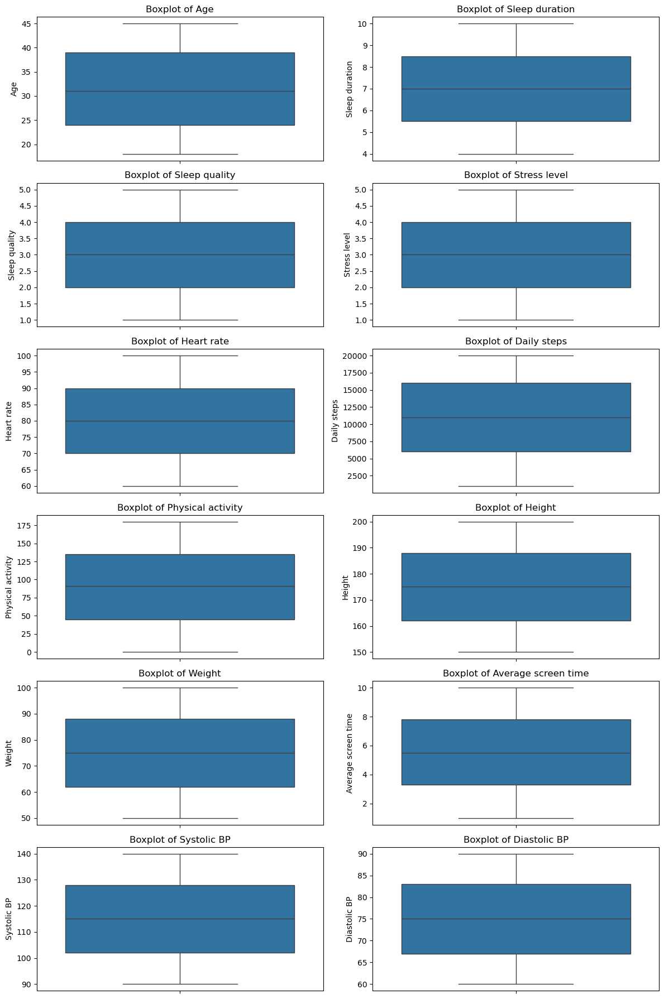

In [2193]:
# checking for outliers
numeric=df.select_dtypes(include=np.number).columns
plt.figure(figsize=(12,18))
t=1
for i in numeric:
    plt.subplot(6,2,t)
    sns.boxplot(df[i])
    plt.title(f'Boxplot of {i}')
    t+=1
plt.tight_layout()
plt.show()

<b>
1.No severe outliers in most features.

2.Distributions appear fairly normal or slightly skewed in some cases.
</b>

# Univariate Analysis

## numeric columns

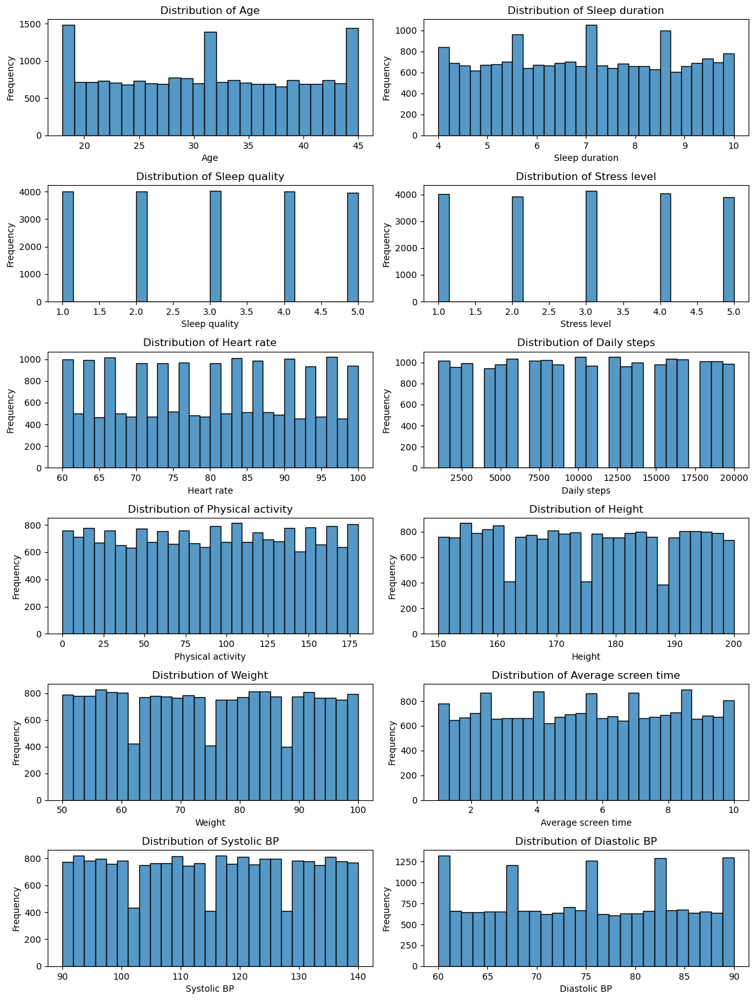

In [2197]:
numeric=df.select_dtypes(include=np.number).columns
plt.figure(figsize=(12,18))
t=1
for i in numeric:
    plt.subplot(7,2,t)
    sns.histplot(df[i])
    plt.title(f'Distribution of {i}')
    plt.xlabel(i)
    plt.ylabel('Frequency')
    t+=1
plt.tight_layout()
plt.show()

<p><b>Age:</b>The age distribution appears roughly uniform between 18 and 45, but there's a notable absence of older adults (above 45 years).</p>
<p><b>Sleep duration:</b>Sleep Duration is slightly right-skewed — many sleep around 6–8 hours, which is ideal, but a subset sleeps <6 hours.</p>
<p><b>Sleep quality:</b>Sleep Quality shows an even spread — indicating variability, and low sleep quality is a known DED risk factor.</p>
<p><b>Stress level:</b>Stress Level:Spread across the full 1–5 scale. Some users report high stress.</p>
<p><b>Average Screen Time:</b>Nearly uniform, with many individuals having >6 hours/day of screen time.High screen exposure reduces blink rate, a direct trigger for Dry Eye Disease — this is likely a strong predictive feature.</p>
<p><b>Heart rate:</b>Uniform, but some individuals are on the higher side (90–100 bpm).</p>

### checking skewness of numeric variables

In [2200]:
for i in numeric:
    print(f'Skewness of {i} :',df[i].skew())

Skewness of Age : 0.012765010339320579
Skewness of Sleep duration : 0.0015794336386755236
Skewness of Sleep quality : 0.0011376691643403703
Skewness of Stress level : -0.0009764772626639374
Skewness of Heart rate : 0.00019477126685491902
Skewness of Daily steps : -0.008296939087729407
Skewness of Physical activity : -0.0055481771022512045
Skewness of Height : 0.013622862197622949
Skewness of Weight : 0.00779453120943488
Skewness of Average screen time : -0.008788709676718371
Skewness of Systolic BP : -0.0028217283494799744
Skewness of Diastolic BP : -0.0026841995253147916


## Categoric columns

In [2202]:
categoric=df.select_dtypes(include='object').columns
for i in categoric:
    print(df[i].value_counts(normalize=True)*100)

Gender
M    50.14
F    49.86
Name: proportion, dtype: float64
Sleep disorder
N    50.345
Y    49.655
Name: proportion, dtype: float64
Wake up during night
N    50.0
Y    50.0
Name: proportion, dtype: float64
Feel sleepy during day
N    50.89
Y    49.11
Name: proportion, dtype: float64
Caffeine consumption
Y    50.445
N    49.555
Name: proportion, dtype: float64
Alcohol consumption
Y    50.045
N    49.955
Name: proportion, dtype: float64
Smoking
N    50.085
Y    49.915
Name: proportion, dtype: float64
Medical issue
N    50.555
Y    49.445
Name: proportion, dtype: float64
Ongoing medication
Y    50.41
N    49.59
Name: proportion, dtype: float64
Smart device before bed
Y    50.015
N    49.985
Name: proportion, dtype: float64
Blue-light filter
N    50.08
Y    49.92
Name: proportion, dtype: float64
Discomfort Eye-strain
Y    50.185
N    49.815
Name: proportion, dtype: float64
Redness in eye
N    50.645
Y    49.355
Name: proportion, dtype: float64
Itchiness/Irritation in eye
N    50.315
Y   

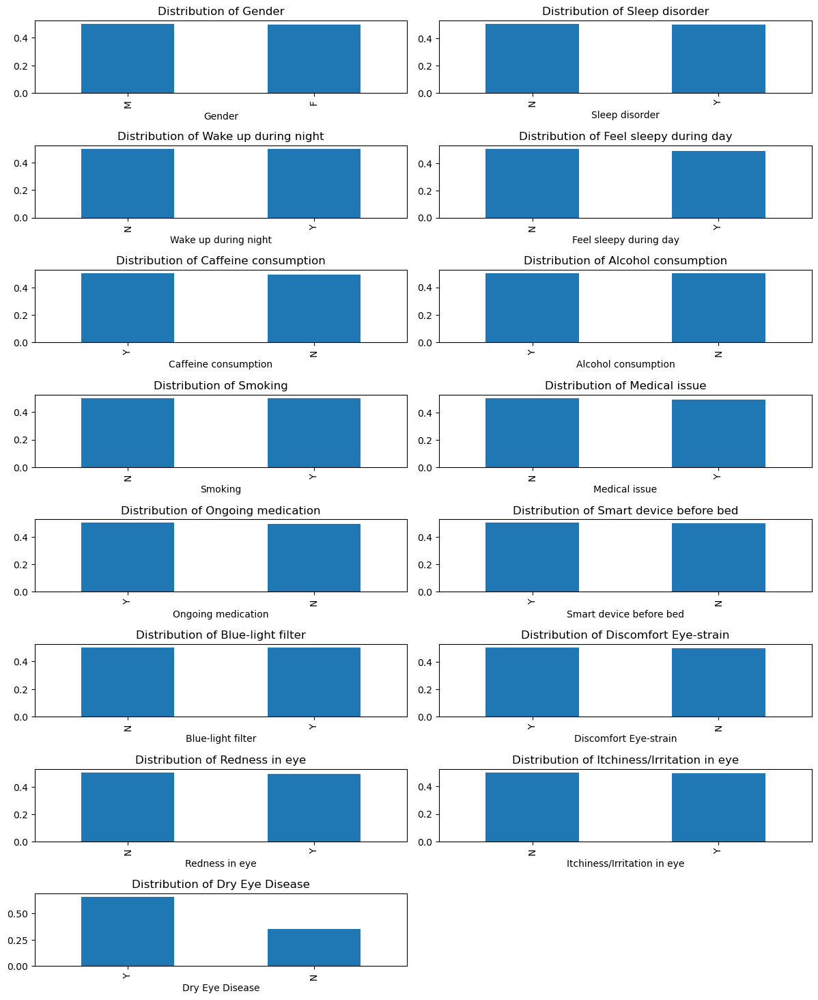

In [2203]:


plt.figure(figsize=(12, 18))
t = 1

for i in categoric:
    plt.subplot(10, 2, t)
    df[i].value_counts(normalize=True).plot(kind='bar')
    plt.title(f'Distribution of {i}')
    plt.ylabel('')
    t += 1

plt.tight_layout()
plt.show()


<p>1. Almost all the features are fairly distributed.</p>
<p>2.<b>Dry Eye Disease:Yes: 65.2%, No: 34.8%</b></br>
Indicates a mild class imbalance — might influence classification metrics like accuracy.</p>

# Bi-variate analysis

##### checking numeric features relationship with target

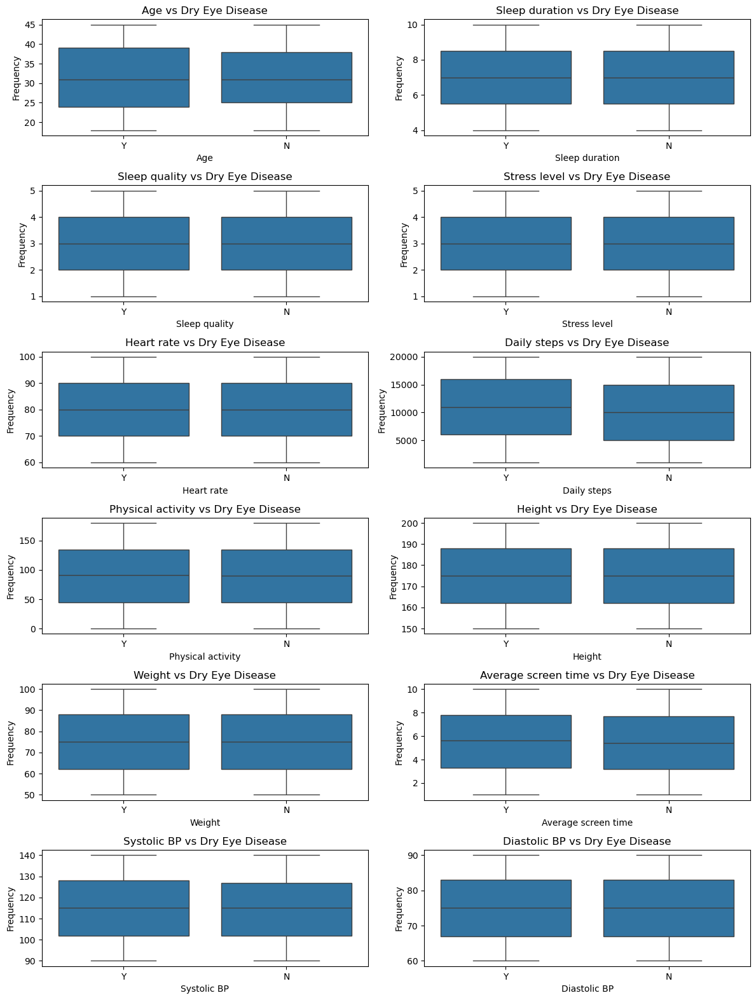

In [2207]:
plt.figure(figsize=(12, 18))
t=1
for i in numeric:
    plt.subplot(7,2,t)
    sns.boxplot(y=df[i], x=df['Dry Eye Disease'])
    plt.title(f'{i} vs Dry Eye Disease')
    plt.xlabel(i)
    plt.ylabel('Frequency')
    t+=1
plt.tight_layout()
plt.show()

<p>

<b>Age:</b>

Slight upward trend in DED frequency with increasing age.Indicates that older individuals are more prone to Dry Eye Disease.

<b>Sleep Duration:</b>

Moderate fluctuations, but overall, DED frequency seems slightly lower with longer sleep durations.Poor sleep may be linked to increased risk of DED.

<b>Heart Rate:</b>

No strong pattern observed, though slightly more DED cases are seen at lower and higher extremes, suggesting possible impact of health/stress levels.

<b>Daily Steps:</b>

Slight downward trend – more physically active individuals (higher steps) seem to have fewer DED cases.Physical activity may help reduce risk.

<b>Physical Activity:</b>

High variability, but generally lower DED frequency at moderate-to-high activity levels.Reinforces that inactivity might correlate with DED.

<b>Height:</b>

No consistent relationship with DED observed.Likely not a significant predictor.

<b>Weight:</b>

Slight upward trend in DED frequency with increasing weight.

<b>Average Screen Time:</b>

Clear upward trend: more screen time strongly correlates with higher DED frequency.Indicates screen exposure is a major risk factor.

<b>Systolic BP:</b>

Moderate rise in DED frequency at higher systolic BP.High BP might be indirectly linked to DED via overall health conditions.

<b>Diastolic BP:</b>

Similar trend to systolic – DED increases with higher diastolic BP.Suggests possible vascular or systemic health impact on eye health.</p>

#### categoric features relationship with target

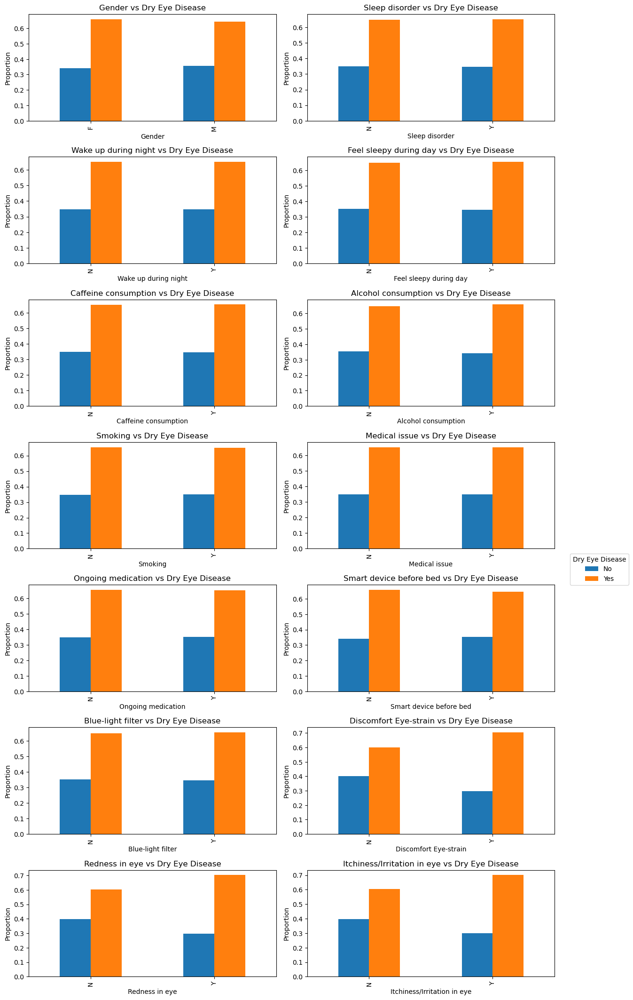

In [2210]:
plt.figure(figsize=(12, 24))
t = 1

for col in categoric:
    if col != 'Dry Eye Disease':
        ax = plt.subplot(8, 2, t)
        pd.crosstab(df[col], df['Dry Eye Disease'], normalize='index').plot(
            kind='bar', ax=ax, legend=False)
        ax.set_title(f'{col} vs Dry Eye Disease')
        ax.set_ylabel('Proportion')
        ax.set_xlabel(col)
        t += 1

plt.tight_layout()
plt.legend(['No', 'Yes'], title='Dry Eye Disease', bbox_to_anchor=(1.05, 4), loc='upper left')
plt.show()

<p><b>
Females, individuals with poor sleep quality, high stress, and sleep disorders are more likely to have Dry Eye Disease (DED).

Excessive screen time, especially before bed, and symptoms like eye strain, redness, and irritation are strong indicators of DED.

Use of blue-light filters and maintaining good sleep hygiene may help reduce the risk of DED.

Health factors such as medical issues, ongoing medication, and smoking also show moderate influence on DED presence.</b>
</p>

# Feature Engineering

In [2213]:
df['Pulse_Pressure']=df['Systolic BP']-df['Diastolic BP']

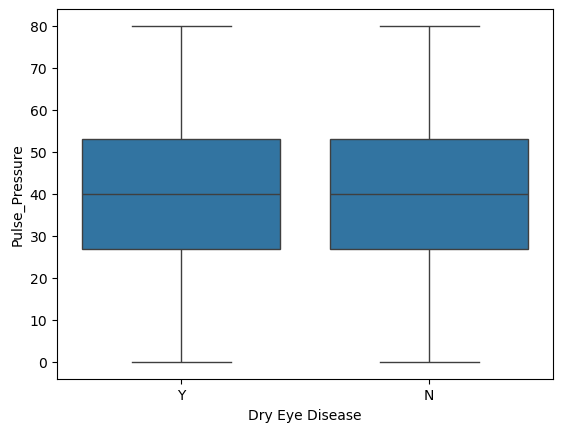

In [2214]:
sns.boxplot(x=df['Dry Eye Disease'],y=df['Pulse_Pressure'])
plt.show()

<b>Pulse Pressure does not show a strong univariate association with Dry Eye Disease.</b>

In [2216]:
# adding one more feature 'BMI'

In [2217]:
df['BMI']=df['Weight'] / (df['Height']/100)**2

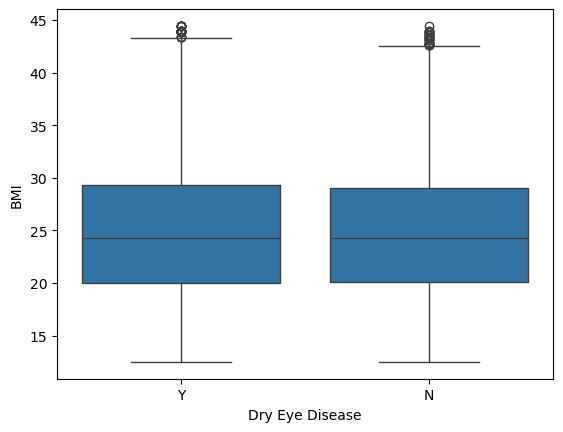

In [2218]:
sns.boxplot(x=df['Dry Eye Disease'],y=df['BMI'])
plt.show()

<p>Median BMI is almost identical for both DED and non-DED groups.</br>
Both groups have similar interquartile ranges (IQR), indicating comparable variability.</br>
There are slightly more high-end outliers in the DED group, but not significantly different.</p>

In [2220]:
# Adding Blood pressure category based on systolic and diastolic metrics using data/facts from American Heart Association

In [2221]:
def classify_bp(row):
    systolic = row['Systolic BP']
    diastolic = row['Diastolic BP']
    
    if systolic > 180 or diastolic > 120:
        return 'Hypertensive Crisis'
    elif systolic >= 140 or diastolic >= 90:
        return 'Hypertension Stage 2'
    elif systolic >= 130 or diastolic >= 80:
        return 'Hypertension Stage 1'
    elif systolic >= 120 and diastolic < 80:
        return 'Elevated'
    else:
        return 'Normal'
# Create new column
df['BP_category'] = df.apply(classify_bp, axis=1)

Text(0.5, 1.0, 'BP_category vs Dry eye disease')

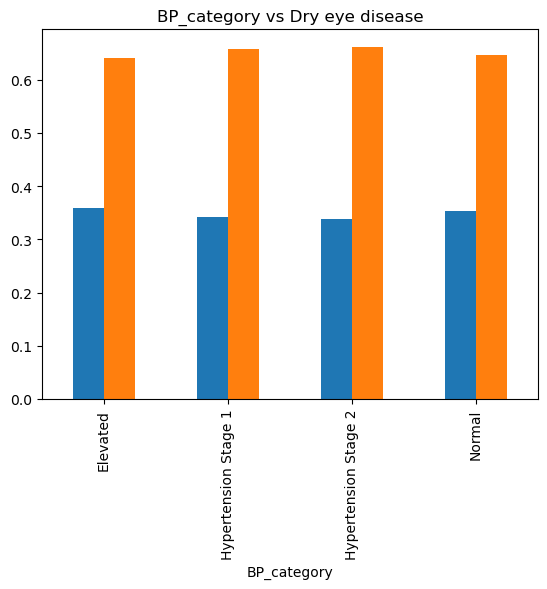

In [2223]:
pd.crosstab(df['BP_category'], df['Dry Eye Disease'], normalize='index').plot(kind='bar',legend=False)
plt.title('BP_category vs Dry eye disease')

<p>The proportion of individuals with Dry Eye Disease (DED) appears to be slightly higher in those categorized under:</br>
<b>Hypertension Stage 1</b></br>
<b>Hypertension Stage 2 </b></p>
<p>Even though the differences are not dramatic, the orange bars (indicating DED = "Yes") 
show a small upward trend from <b>Normal and Elevated BP </b>categories</br> to <b>Stage 1 and Stage 2</b>.</p>

## Note

<p>We can't categorize age because we don't have significant data in age column</p>

In [2227]:
# Categorizing sleep duration based on data/facts provided by WHO

In [2228]:
def categorize_sleep(duration):
    if duration < 7:
        return 'Short'
    elif 7 <= duration <= 9:
        return 'Healthy'
    else:
        return 'Long'

df['Sleep_category'] = df['Sleep duration'].apply(categorize_sleep)

<Axes: xlabel='Sleep_category'>

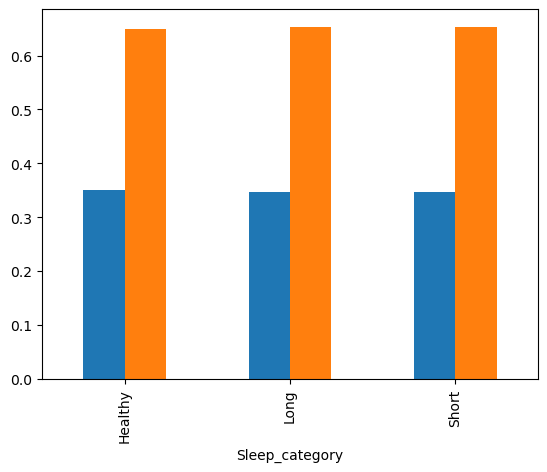

In [2229]:
pd.crosstab(df['Sleep_category'], df['Dry Eye Disease'], normalize='index').plot(kind='bar',legend=False)

<p><b>There is no significant variation in the prevalence of Dry Eye Disease across different sleep duration categories.</b></p>

In [2231]:
#categorizing average screen time using data/facts from National Institute of health

In [2232]:
def categorize_screen_time(hours):
    if hours <= 2:
        return 'Low'
    elif hours <= 6:
        return 'Moderate'
    elif hours <= 9:
        return 'High'
    else:
        return 'Very High'

df['Screen_Time_Category'] = df['Average screen time'].apply(categorize_screen_time)

<Axes: xlabel='Screen_Time_Category'>

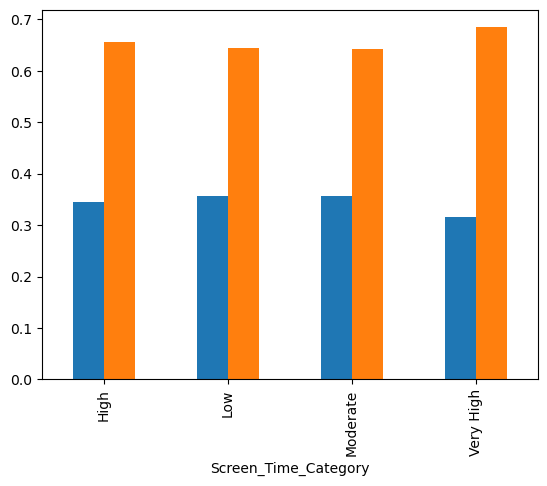

In [2237]:
pd.crosstab(df['Screen_Time_Category'], df['Dry Eye Disease'], normalize='index').plot(kind='bar',legend=False)

<p>The "Very High" screen time category shows the highest proportion of individuals with Dry Eye Disease (DED).</br>
The "Low", "Moderate", and "High" categories all show a relatively lower and consistent proportion of DED cases.</p>
<p><b>This suggests a positive association between very high screen time (≥10 hrs/day) and DED prevalence.</b></p>

In [2239]:
# Using heat map checking corelation after adding new features

<Axes: >

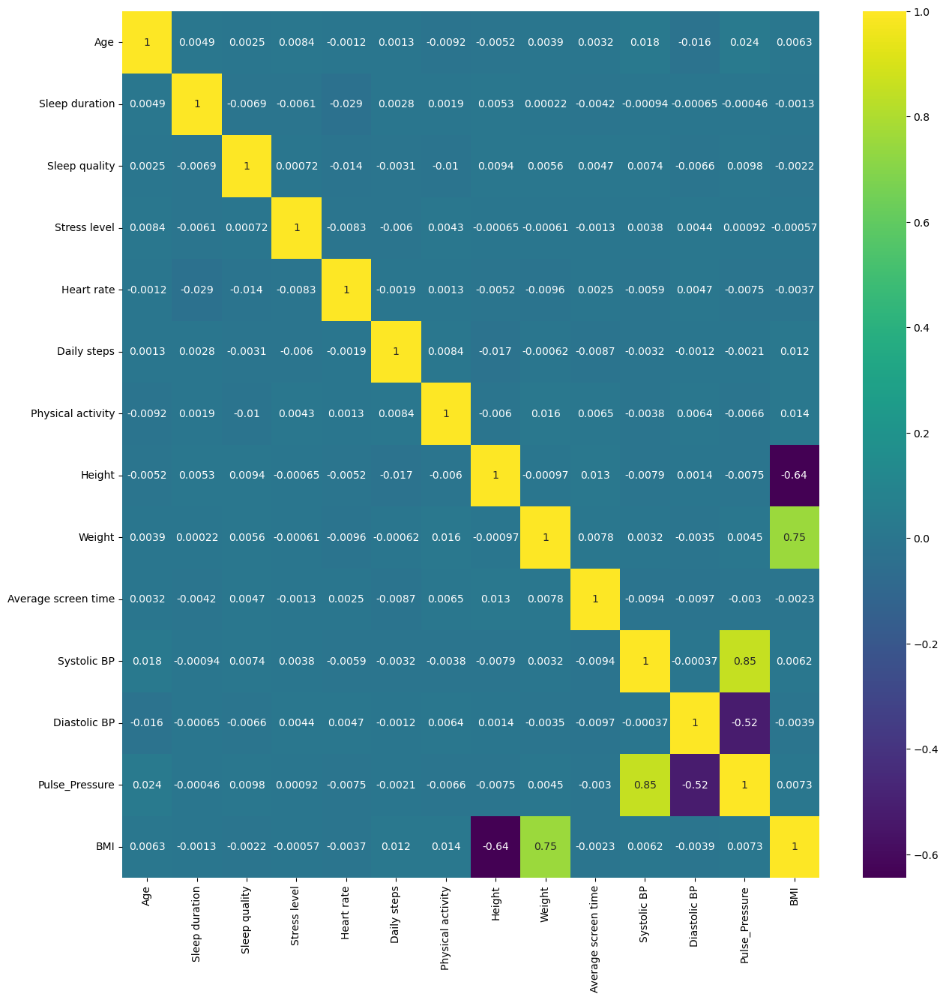

In [2240]:
numeric=df.select_dtypes(include=np.number).columns
plt.figure(figsize=(15,15))
sns.heatmap(df[numeric].corr(),annot=True,cmap='viridis')

<p>
<b>Systolic BP shows a strong positive correlation with Pulse Pressure (0.85), meaning higher systolic pressure is associated with higher pulse pressure.

BMI has a strong positive correlation with Weight (0.75) and a strong negative correlation with Height (-0.64), which is expected given BMI's formula.

Diastolic BP is moderately negatively correlated with Pulse Pressure (-0.52), indicating an inverse relationship.

Most features like age, sleep duration, physical activity, screen time, etc. show very weak or negligible correlations with each other (values close to 0), suggesting they are largely independent in this dataset.</b>
</p>

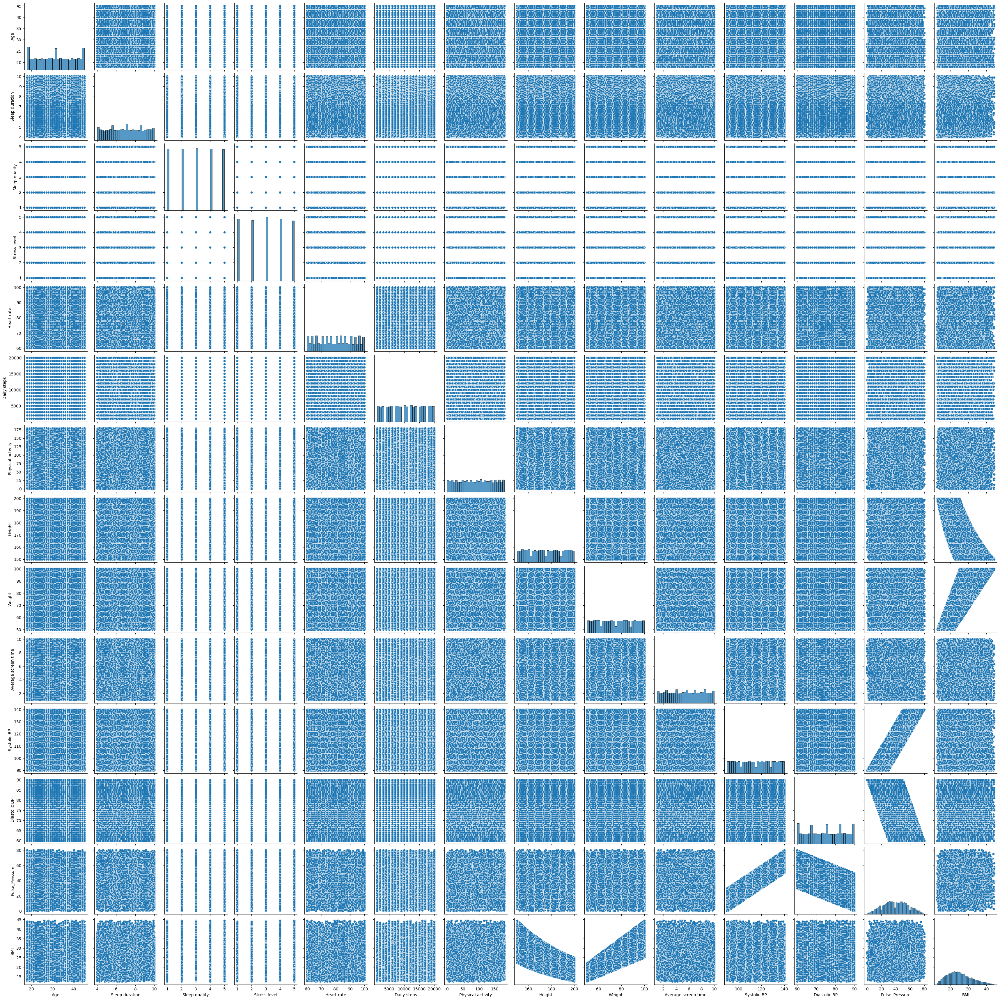

In [2242]:
sns.pairplot(df)
plt.show()

In [2243]:
df.head()

,Gender,Age,Sleep duration,Sleep quality,Stress level,Heart rate,Daily steps,Physical activity,Height,Weight,Sleep disorder,Wake up during night,Feel sleepy during day,Caffeine consumption,Alcohol consumption,Smoking,Medical issue,Ongoing medication,Smart device before bed,Average screen time,Blue-light filter,Discomfort Eye-strain,Redness in eye,Itchiness/Irritation in eye,Dry Eye Disease,Systolic BP,Diastolic BP,Pulse_Pressure,BMI,BP_category,Sleep_category,Screen_Time_Category
0,F,24,9.5,2,1,67,3000,31,161,69,Y,N,N,N,N,N,Y,Y,N,8.7,N,Y,Y,N,Y,137,89,48,26.619343,Hypertension Stage 1,Long,High
1,M,39,9.6,2,3,60,12000,74,164,87,N,N,N,N,Y,N,Y,Y,N,9.6,Y,N,N,Y,Y,108,64,44,32.346817,Normal,Long,Very High
2,F,45,5.4,1,5,95,12000,93,179,94,Y,Y,N,Y,Y,N,N,N,Y,4.0,N,Y,N,N,N,134,81,53,29.337411,Hypertension Stage 1,Short,Moderate
3,F,45,5.4,4,5,78,19000,32,160,77,N,N,N,Y,N,N,Y,N,N,7.6,N,Y,N,Y,N,110,90,20,30.078125,Hypertension Stage 2,Short,High
4,F,42,5.7,3,2,72,4000,173,179,99,N,Y,N,N,N,N,Y,N,N,3.5,N,Y,Y,N,Y,99,67,32,30.897912,Normal,Short,Moderate


In [2244]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 32 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Gender                       20000 non-null  object 
 1   Age                          20000 non-null  int64  
 2   Sleep duration               20000 non-null  float64
 3   Sleep quality                20000 non-null  int64  
 4   Stress level                 20000 non-null  int64  
 5   Heart rate                   20000 non-null  int64  
 6   Daily steps                  20000 non-null  int64  
 7   Physical activity            20000 non-null  int64  
 8   Height                       20000 non-null  int64  
 9   Weight                       20000 non-null  int64  
 10  Sleep disorder               20000 non-null  object 
 11  Wake up during night         20000 non-null  object 
 12  Feel sleepy during day       20000 non-null  object 
 13  Caffeine consump

# Checking the Relationship Between Categorical Features and Target (Dry Eye Disease)

In [2247]:
categoric=df.select_dtypes(include='object').columns

In [2248]:
from scipy.stats import chi2_contingency

for col in categoric:
    if col !='Dry Eye Disease':
        contingency_table = pd.crosstab(df[col], df['Dry Eye Disease'])
        chi2, p, dof, expected = chi2_contingency(contingency_table)
        print(f"Chi-squared test for {col}:")
        print(f"  p-value: {p}")
        if p < 0.05:
            print("  Conclusion: There is a statistically significant association between", col, "and Dry Eye Disease.")
        else:
            print("  Conclusion: There is no statistically significant association between", col, "and Dry Eye Disease.")

Chi-squared test for Gender:
  p-value: 0.021828490579784587
  Conclusion: There is a statistically significant association between Gender and Dry Eye Disease.
Chi-squared test for Sleep disorder:
  p-value: 0.7221535325778164
  Conclusion: There is no statistically significant association between Sleep disorder and Dry Eye Disease.
Chi-squared test for Wake up during night:
  p-value: 0.976317135025137
  Conclusion: There is no statistically significant association between Wake up during night and Dry Eye Disease.
Chi-squared test for Feel sleepy during day:
  p-value: 0.5130635624335508
  Conclusion: There is no statistically significant association between Feel sleepy during day and Dry Eye Disease.
Chi-squared test for Caffeine consumption:
  p-value: 0.6998640860594175
  Conclusion: There is no statistically significant association between Caffeine consumption and Dry Eye Disease.
Chi-squared test for Alcohol consumption:
  p-value: 0.11471729580950671
  Conclusion: There is no st

# Checking relationship between numeric columns and Target(DED)

In [2250]:
from scipy.stats import ttest_ind
numeric=df.select_dtypes(include=np.number).columns
for i in numeric:
    group1=df[df['Dry Eye Disease']=='Y'][i]
    group2=df[df['Dry Eye Disease']=='N'][i]
    t_stat, p_val = ttest_ind(group1, group2, equal_var=False)
    print(f"ttest_ind for {i}:")
    print(f"  p-value: {p_val}")
    if p_val < 0.05:
        print("  Conclusion: There is a statistically significant association between", i, "and Dry Eye Disease.")
    else:
        print("  Conclusion: There is no statistically significant association between", i, "and Dry Eye Disease.")

ttest_ind for Age:
  p-value: 0.4551966961334818
  Conclusion: There is no statistically significant association between Age and Dry Eye Disease.
ttest_ind for Sleep duration:
  p-value: 0.9017517338200809
  Conclusion: There is no statistically significant association between Sleep duration and Dry Eye Disease.
ttest_ind for Sleep quality:
  p-value: 0.48058640504727035
  Conclusion: There is no statistically significant association between Sleep quality and Dry Eye Disease.
ttest_ind for Stress level:
  p-value: 0.43780627515387893
  Conclusion: There is no statistically significant association between Stress level and Dry Eye Disease.
ttest_ind for Heart rate:
  p-value: 0.7686684301333943
  Conclusion: There is no statistically significant association between Heart rate and Dry Eye Disease.
ttest_ind for Daily steps:
  p-value: 0.42294616126017226
  Conclusion: There is no statistically significant association between Daily steps and Dry Eye Disease.
ttest_ind for Physical activity

#### Checking relationship of 'Discomfort Eye-strain' with others

In [2253]:
categoric=df.select_dtypes(include='object').columns
for col in categoric:
    if col !='Discomfort Eye-strain':
        contingency_table = pd.crosstab(df[col], df['Discomfort Eye-strain'])
        chi2, p, dof, expected = chi2_contingency(contingency_table)
        print(f"Chi-squared test for {col}:")
        print(f"  p-value: {p}")
        if p < 0.05:
            print("  Conclusion: There is a statistically significant association between", col, "and Discomfort_Eye_strain.")
        else:
            print("  Conclusion: There is no statistically significant association between", col, "and Discomfort_Eye_strain.")

Chi-squared test for Gender:
  p-value: 0.15686513706263844
  Conclusion: There is no statistically significant association between Gender and Discomfort_Eye_strain.
Chi-squared test for Sleep disorder:
  p-value: 0.05224098750401518
  Conclusion: There is no statistically significant association between Sleep disorder and Discomfort_Eye_strain.
Chi-squared test for Wake up during night:
  p-value: 0.0389451525446194
  Conclusion: There is a statistically significant association between Wake up during night and Discomfort_Eye_strain.
Chi-squared test for Feel sleepy during day:
  p-value: 0.18060451667099042
  Conclusion: There is no statistically significant association between Feel sleepy during day and Discomfort_Eye_strain.
Chi-squared test for Caffeine consumption:
  p-value: 0.40667022683071474
  Conclusion: There is no statistically significant association between Caffeine consumption and Discomfort_Eye_strain.
Chi-squared test for Alcohol consumption:
  p-value: 0.4363956911859

In [2254]:
numeric=df.select_dtypes(include=np.number).columns
for i in numeric:
    group1=df[df['Discomfort Eye-strain']=='Y'][i]
    group2=df[df['Discomfort Eye-strain']=='N'][i]
    t_stat, p_val = ttest_ind(group1, group2, equal_var=False)
    print(f"ttest_ind for {i}:")
    print(f"  p-value: {p_val}")
    if p_val < 0.05:
        print("  Conclusion: There is a statistically significant association between", i, "and Discomfort_Eye_strain.")
    else:
        print("  Conclusion: There is no statistically significant association between", i, "and Discomfort_Eye_strain.")

ttest_ind for Age:
  p-value: 0.8798165544035563
  Conclusion: There is no statistically significant association between Age and Discomfort_Eye_strain.
ttest_ind for Sleep duration:
  p-value: 0.3547867905298251
  Conclusion: There is no statistically significant association between Sleep duration and Discomfort_Eye_strain.
ttest_ind for Sleep quality:
  p-value: 0.8365610933041095
  Conclusion: There is no statistically significant association between Sleep quality and Discomfort_Eye_strain.
ttest_ind for Stress level:
  p-value: 0.5823154997553185
  Conclusion: There is no statistically significant association between Stress level and Discomfort_Eye_strain.
ttest_ind for Heart rate:
  p-value: 0.006522746061377654
  Conclusion: There is a statistically significant association between Heart rate and Discomfort_Eye_strain.
ttest_ind for Daily steps:
  p-value: 0.9879673468121671
  Conclusion: There is no statistically significant association between Daily steps and Discomfort_Eye_strai

#### Checking relation between Redness_in_eye with other features

In [2256]:
for col in categoric:
    if col !='Redness in eye':
        contingency_table = pd.crosstab(df[col], df['Redness in eye'])
        chi2, p, dof, expected = chi2_contingency(contingency_table)
        print(f"Chi-squared test for {col}:")
        print(f"  p-value: {p}")
        if p < 0.05:
            print("  Conclusion: There is a statistically significant association between", col, "and Redness_in_eye.")
        else:
            print("  Conclusion: There is no statistically significant association between", col, "and Redness_in_eye.")

Chi-squared test for Gender:
  p-value: 0.30610407349932006
  Conclusion: There is no statistically significant association between Gender and Redness_in_eye.
Chi-squared test for Sleep disorder:
  p-value: 0.822178433407876
  Conclusion: There is no statistically significant association between Sleep disorder and Redness_in_eye.
Chi-squared test for Wake up during night:
  p-value: 0.5715756393673286
  Conclusion: There is no statistically significant association between Wake up during night and Redness_in_eye.
Chi-squared test for Feel sleepy during day:
  p-value: 0.3104444205228418
  Conclusion: There is no statistically significant association between Feel sleepy during day and Redness_in_eye.
Chi-squared test for Caffeine consumption:
  p-value: 0.9307049417149937
  Conclusion: There is no statistically significant association between Caffeine consumption and Redness_in_eye.
Chi-squared test for Alcohol consumption:
  p-value: 0.7677130484842005
  Conclusion: There is no statisti

In [2257]:
for i in numeric:
    group1=df[df['Redness in eye']=='Y'][i]
    group2=df[df['Redness in eye']=='N'][i]
    t_stat, p_val = ttest_ind(group1, group2, equal_var=False)
    print(f"ttest_ind for {i}:")
    print(f"  p-value: {p_val}")
    if p_val < 0.05:
        print("  Conclusion: There is a statistically significant association between", i, "and Redness_in_eye.")
    else:
        print("  Conclusion: There is no statistically significant association between", i, "and Redness_in_eye.")

ttest_ind for Age:
  p-value: 0.14388904952763704
  Conclusion: There is no statistically significant association between Age and Redness_in_eye.
ttest_ind for Sleep duration:
  p-value: 0.5416949597060445
  Conclusion: There is no statistically significant association between Sleep duration and Redness_in_eye.
ttest_ind for Sleep quality:
  p-value: 0.6876887964293896
  Conclusion: There is no statistically significant association between Sleep quality and Redness_in_eye.
ttest_ind for Stress level:
  p-value: 0.08997575297866588
  Conclusion: There is no statistically significant association between Stress level and Redness_in_eye.
ttest_ind for Heart rate:
  p-value: 0.5402524009124072
  Conclusion: There is no statistically significant association between Heart rate and Redness_in_eye.
ttest_ind for Daily steps:
  p-value: 0.9172460074626028
  Conclusion: There is no statistically significant association between Daily steps and Redness_in_eye.
ttest_ind for Physical activity:
  p-v

#### Checking Itchiness_Irritation_in_eye relation with other features

In [2259]:
for col in categoric:
    if col !='Itchiness/Irritation in eye':
        contingency_table = pd.crosstab(df[col], df['Itchiness/Irritation in eye'])
        chi2, p, dof, expected = chi2_contingency(contingency_table)
        print(f"Chi-squared test for {col}:")
        print(f"  p-value: {p}")
        if p < 0.05:
            print("  Conclusion: There is a statistically significant association between", col, "and Itchiness_Irritation_in_eye.")
        else:
            print("  Conclusion: There is no statistically significant association between", col, "and Itchiness_Irritation_in_eye.")

Chi-squared test for Gender:
  p-value: 0.9794246694000222
  Conclusion: There is no statistically significant association between Gender and Itchiness_Irritation_in_eye.
Chi-squared test for Sleep disorder:
  p-value: 0.3402292909659239
  Conclusion: There is no statistically significant association between Sleep disorder and Itchiness_Irritation_in_eye.
Chi-squared test for Wake up during night:
  p-value: 0.5716000120355238
  Conclusion: There is no statistically significant association between Wake up during night and Itchiness_Irritation_in_eye.
Chi-squared test for Feel sleepy during day:
  p-value: 0.4030131843010545
  Conclusion: There is no statistically significant association between Feel sleepy during day and Itchiness_Irritation_in_eye.
Chi-squared test for Caffeine consumption:
  p-value: 0.8603499367099143
  Conclusion: There is no statistically significant association between Caffeine consumption and Itchiness_Irritation_in_eye.
Chi-squared test for Alcohol consumption:

In [2260]:
for i in numeric:
    group1=df[df['Redness in eye']=='Y'][i]
    group2=df[df['Redness in eye']=='N'][i]
    t_stat, p_val = ttest_ind(group1, group2, equal_var=False)
    print(f"ttest_ind for {i}:")
    print(f"  p-value: {p_val}")
    if p_val < 0.05:
        print("  Conclusion: There is a statistically significant association between", i, "and Redness_in_eye.")
    else:
        print("  Conclusion: There is no statistically significant association between", i, "and Redness_in_eye.")

ttest_ind for Age:
  p-value: 0.14388904952763704
  Conclusion: There is no statistically significant association between Age and Redness_in_eye.
ttest_ind for Sleep duration:
  p-value: 0.5416949597060445
  Conclusion: There is no statistically significant association between Sleep duration and Redness_in_eye.
ttest_ind for Sleep quality:
  p-value: 0.6876887964293896
  Conclusion: There is no statistically significant association between Sleep quality and Redness_in_eye.
ttest_ind for Stress level:
  p-value: 0.08997575297866588
  Conclusion: There is no statistically significant association between Stress level and Redness_in_eye.
ttest_ind for Heart rate:
  p-value: 0.5402524009124072
  Conclusion: There is no statistically significant association between Heart rate and Redness_in_eye.
ttest_ind for Daily steps:
  p-value: 0.9172460074626028
  Conclusion: There is no statistically significant association between Daily steps and Redness_in_eye.
ttest_ind for Physical activity:
  p-v

## Removing spaces and special characters from column names

In [2290]:
df.columns = df.columns.str.strip()  # remove leading/trailing spaces
df.columns = df.columns.str.replace('[^0-9a-zA-Z]+', '_', regex=True)

In [2292]:
df.columns

Index(['Gender', 'Age', 'Sleep_duration', 'Sleep_quality', 'Stress_level',
       'Heart_rate', 'Daily_steps', 'Physical_activity', 'Height', 'Weight',
       'Sleep_disorder', 'Wake_up_during_night', 'Feel_sleepy_during_day',
       'Caffeine_consumption', 'Alcohol_consumption', 'Smoking',
       'Medical_issue', 'Ongoing_medication', 'Smart_device_before_bed',
       'Average_screen_time', 'Blue_light_filter', 'Discomfort_Eye_strain',
       'Redness_in_eye', 'Itchiness_Irritation_in_eye', 'Dry_Eye_Disease',
       'Systolic_BP', 'Diastolic_BP', 'Pulse_Pressure', 'BMI', 'BP_category',
       'Sleep_category', 'Screen_Time_Category'],
      dtype='object')

In [2294]:
categoric=df.select_dtypes(include='object').columns
categoric

Index(['Gender', 'Sleep_disorder', 'Wake_up_during_night',
       'Feel_sleepy_during_day', 'Caffeine_consumption', 'Alcohol_consumption',
       'Smoking', 'Medical_issue', 'Ongoing_medication',
       'Smart_device_before_bed', 'Blue_light_filter', 'Discomfort_Eye_strain',
       'Redness_in_eye', 'Itchiness_Irritation_in_eye', 'Dry_Eye_Disease',
       'BP_category', 'Sleep_category', 'Screen_Time_Category'],
      dtype='object')

# Encoding the categoric features

In [2297]:
#df=df.drop('symptom_severity',axis=1)

In [2513]:
df1=df.copy()

In [2515]:
df1=df1.drop(['Height','Weight'],axis=1)

In [2517]:
cols=['Sleep_disorder', 'Wake_up_during_night',
       'Feel_sleepy_during_day', 'Caffeine_consumption', 'Alcohol_consumption',
       'Smoking', 'Medical_issue', 'Ongoing_medication',
       'Smart_device_before_bed', 'Blue_light_filter', 'Discomfort_Eye_strain',
       'Redness_in_eye', 'Itchiness_Irritation_in_eye', 'Dry_Eye_Disease']

In [2519]:
df1[cols] = df1[cols].applymap(lambda x: 1 if x == 'Y' else 0)

In [2521]:
df1 = pd.get_dummies(df1, columns=['BP_category', 'Sleep_category', 'Screen_Time_Category'], drop_first=True,dtype=int)

In [2523]:
df1['Gender']=df1['Gender'].apply(lambda x:1 if x=='M' else 0)

In [2525]:
numcol=['Age', 'Sleep_duration', 'Sleep_quality', 'Stress_level', 'Heart_rate','Daily_steps', 'Physical_activity',
        'Average_screen_time', 'Systolic_BP', 'Diastolic_BP', 'Pulse_Pressure','BMI']

In [2527]:
ss=StandardScaler()
df1[numcol]=ss.fit_transform(df1[numcol])

<IPython.core.display.Javascript object>

In [2529]:
df1.head(5)

,Gender,Age,Sleep_duration,Sleep_quality,Stress_level,Heart_rate,Daily_steps,Physical_activity,Sleep_disorder,Wake_up_during_night,Feel_sleepy_during_day,Caffeine_consumption,Alcohol_consumption,Smoking,Medical_issue,Ongoing_medication,Smart_device_before_bed,Average_screen_time,Blue_light_filter,Discomfort_Eye_strain,Redness_in_eye,Itchiness_Irritation_in_eye,Dry_Eye_Disease,Systolic_BP,Diastolic_BP,Pulse_Pressure,BMI,BP_category_Hypertension Stage 1,BP_category_Hypertension Stage 2,BP_category_Normal,Sleep_category_Long,Sleep_category_Short,Screen_Time_Category_Low,Screen_Time_Category_Moderate,Screen_Time_Category_Very High
0,0,-0.915998,1.444698,-0.706144,-1.416821,-1.093514,-1.310176,-1.129096,1,0,0,0,0,0,1,1,0,1.220193,0,1,1,0,1,1.495023,1.560000,0.464637,0.242683,1,0,0,1,0,0,0,0
1,1,0.935051,1.502446,-0.706144,0.004441,-1.686334,0.254338,-0.307167,0,0,0,0,1,0,1,1,0,1.565518,1,0,0,1,1,-0.474387,-1.225575,0.232720,1.114406,0,0,1,1,0,0,0,1
2,0,1.675471,-0.922945,-1.414235,1.425704,1.277763,0.254338,0.056011,1,1,0,1,1,0,0,0,1,-0.583171,0,1,0,0,0,1.291291,0.668616,0.754533,0.656374,1,0,0,0,1,0,1,0
3,0,1.675471,-0.922945,0.710039,1.425704,-0.161941,1.471182,-1.109981,0,0,0,1,0,0,1,0,0,0.798129,0,1,0,1,0,-0.338565,1.671423,-1.158782,0.769110,0,1,0,0,1,0,0,0
4,0,1.305261,-0.749703,0.001947,-0.706190,-0.670072,-1.136341,1.585180,0,1,0,0,0,0,1,0,0,-0.775019,0,1,1,0,1,-1.085583,-0.891306,-0.463031,0.893882,0,0,1,0,1,0,1,0


In [2531]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 35 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Gender                            20000 non-null  int64  
 1   Age                               20000 non-null  float64
 2   Sleep_duration                    20000 non-null  float64
 3   Sleep_quality                     20000 non-null  float64
 4   Stress_level                      20000 non-null  float64
 5   Heart_rate                        20000 non-null  float64
 6   Daily_steps                       20000 non-null  float64
 7   Physical_activity                 20000 non-null  float64
 8   Sleep_disorder                    20000 non-null  int64  
 9   Wake_up_during_night              20000 non-null  int64  
 10  Feel_sleepy_during_day            20000 non-null  int64  
 11  Caffeine_consumption              20000 non-null  int64  
 12  Alco

In [2533]:
#df1.to_csv('encoded_dry_eye.csv', index=False)

In [2535]:
# train test split

In [2537]:
X=df1.drop(['Dry_Eye_Disease'],axis=1)
y=df1['Dry_Eye_Disease']

In [2539]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=42,stratify=y)

<IPython.core.display.Javascript object>

In [2541]:
print('Xtrain',X_train.shape)
print('Xtest',X_test.shape)
print('ytrain',y_train.shape)
print('ytest',y_test.shape)

Xtrain (14000, 34)
Xtest (6000, 34)
ytrain (14000,)
ytest (6000,)


In [2543]:
print('y_train')
y_train.value_counts()

y_train


Dry_Eye_Disease
1    9126
0    4874
Name: count, dtype: int64

In [2545]:
print('y_test')
y_test.value_counts()

y_test


Dry_Eye_Disease
1    3911
0    2089
Name: count, dtype: int64

# Defining functions

In [2702]:
def metrics(y_test,y_pred,model):
    print(model)
    print('accuracy',accuracy_score(y_test,y_pred))
    print('precision',precision_score(y_test,y_pred))
    print('recall',recall_score(y_test,y_pred))
    print('fi score',f1_score(y_test,y_pred))
    print('classification report',classification_report(y_test,y_pred))

In [2550]:
def plot_roc_curve(y_true, y_probs, model):
    fpr, tpr, thresholds = roc_curve(y_true, y_probs)

    # Calculate AUC Score
    auc_score = roc_auc_score(y_true, y_probs)
    print(f'ROC-AUC Score for {model}: {auc_score:.2f}')

    # Plot
    plt.figure(figsize=(8,6))
    plt.plot(fpr, tpr, color='blue', label=f'{model} (AUC = {auc_score:.2f})')
    plt.plot([0, 1], [0, 1], color='red', linestyle='--') 
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve - {model}')
    plt.legend()
    plt.grid()
    plt.show()

In [2552]:
def plot_confusion_matrix(y_test, y_pred):

    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6,5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

In [2554]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
def vif_check(X,numcol):
    vif=pd.DataFrame()
    vif['feature']=X[numcol].columns
    vif['vifscore']=[variance_inflation_factor(X[numcol].values,i) for i in range(X[numcol].shape[1])]
    vif['vifscore']=round(vif['vifscore'],2)
    vif=vif.sort_values(by='vifscore',ascending=False)
    return vif

In [2556]:
def imp_feature(model):
    importance = model.feature_importances_
    features = X_train.columns
    
    feat_df = pd.DataFrame({'Feature': features, 'Importance': importance})
    feat_df = feat_df.sort_values(by='Importance', ascending=False)
    
    plt.figure(figsize=(10,6))
    plt.barh(feat_df['Feature'], feat_df['Importance'])
    plt.xlabel("Importance Score")
    plt.ylabel("Features")
    plt.title("Feature Importance")
    plt.gca().invert_yaxis()
    plt.show()

# Model building

### Logistic Regression

In [2560]:
lr=LogisticRegression()
lr_model=lr.fit(X_train,y_train)


<IPython.core.display.Javascript object>

In [2562]:
y_train_pred = lr_model.predict(X_train)
y_test_pred = lr_model.predict(X_test)

metrics(y_train, y_train_pred,'train_metrics')

train_metrics
accuracy 0.6833571428571429
precision 0.6815193006884814
recall 0.96537365768135
fi score 0.7989842651793406
classification report               precision    recall  f1-score   support

           0       0.71      0.16      0.25      4874
           1       0.68      0.97      0.80      9126

    accuracy                           0.68     14000
   macro avg       0.69      0.56      0.53     14000
weighted avg       0.69      0.68      0.61     14000



In [2564]:
metrics(y_test, y_test_pred,'test_metrics')

test_metrics
accuracy 0.677
precision 0.6779080252479711
recall 0.9611352595244184
fi score 0.7950507614213198
classification report               precision    recall  f1-score   support

           0       0.67      0.15      0.24      2089
           1       0.68      0.96      0.80      3911

    accuracy                           0.68      6000
   macro avg       0.67      0.55      0.52      6000
weighted avg       0.67      0.68      0.60      6000



<p><b>The model well performing well on both train and test data</b></p> 

In [2567]:
lr=LogisticRegression()
lr_model=lr.fit(X_train,y_train)
y_pred=lr_model.predict(X_test)
y_pred_proba=lr_model.predict_proba(X_test)[:,1]

<IPython.core.display.Javascript object>

In [2569]:
metrics(y_test,y_pred,'Logistic Regression')

Logistic Regression
accuracy 0.677
precision 0.6779080252479711
recall 0.9611352595244184
fi score 0.7950507614213198
classification report               precision    recall  f1-score   support

           0       0.67      0.15      0.24      2089
           1       0.68      0.96      0.80      3911

    accuracy                           0.68      6000
   macro avg       0.67      0.55      0.52      6000
weighted avg       0.67      0.68      0.60      6000



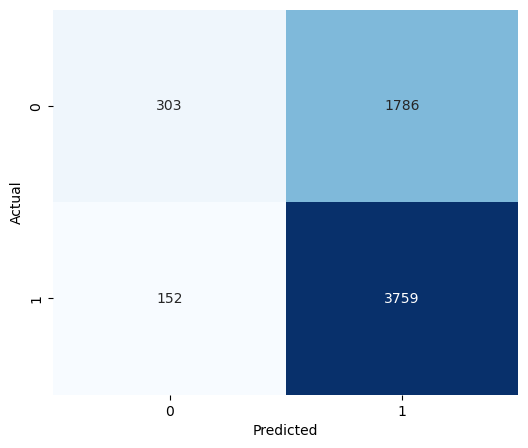

In [2571]:
plot_confusion_matrix(y_test,y_pred)

In [2573]:
metrics(y_test,y_pred,'Logistic Regression')

Logistic Regression
accuracy 0.677
precision 0.6779080252479711
recall 0.9611352595244184
fi score 0.7950507614213198
classification report               precision    recall  f1-score   support

           0       0.67      0.15      0.24      2089
           1       0.68      0.96      0.80      3911

    accuracy                           0.68      6000
   macro avg       0.67      0.55      0.52      6000
weighted avg       0.67      0.68      0.60      6000



In [2575]:
vif_check(X_train,numcol)

,feature,vifscore
8,Systolic_BP,inf
9,Diastolic_BP,inf
10,Pulse_Pressure,inf
0,Age,1.0
1,Sleep_duration,1.0
2,Sleep_quality,1.0
3,Stress_level,1.0
4,Heart_rate,1.0
5,Daily_steps,1.0
6,Physical_activity,1.0


In [2577]:
X=df1.drop(['Dry_Eye_Disease','Diastolic_BP'],axis=1)
y=df1['Dry_Eye_Disease']
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=42)
print('Xtrain',X_train.shape)
print('Xtest',X_test.shape)
print('ytrain',y_train.shape)
print('ytest',y_test.shape)

<IPython.core.display.Javascript object>

Xtrain (14000, 33)
Xtest (6000, 33)
ytrain (14000,)
ytest (6000,)


In [2579]:
numcol1=['Age', 'Sleep_duration', 'Sleep_quality', 'Stress_level', 'Heart_rate','Daily_steps', 'Physical_activity',
        'Average_screen_time', 'Systolic_BP', 'Pulse_Pressure','BMI']
ss=StandardScaler()
X_train[numcol1]=ss.fit_transform(X_train[numcol1])
X_test[numcol1]=ss.transform(X_test[numcol1])

<IPython.core.display.Javascript object>

In [2581]:
vif_check(X_train,numcol1)

,feature,vifscore
8,Systolic_BP,3.65
9,Pulse_Pressure,3.65
0,Age,1.00
1,Sleep_duration,1.00
2,Sleep_quality,1.00
3,Stress_level,1.00
4,Heart_rate,1.00
5,Daily_steps,1.00
6,Physical_activity,1.00
7,Average_screen_time,1.00


In [2583]:
lr=LogisticRegression()
lr_model=lr.fit(X_train,y_train)
train_pred=lr_model.predict(X_train)
y_pred=lr_model.predict(X_test)
y_pred_proba=lr_model.predict_proba(X_test)[:,-1]
y_pred_cust = (y_pred_proba >= 0.4).astype(int)

<IPython.core.display.Javascript object>

In [2585]:
metrics(y_train,train_pred,'train accuracy')

train accuracy
accuracy 0.6821428571428572
precision 0.6797139039534701
recall 0.9584395433891167
fi score 0.7953646647659339
classification report               precision    recall  f1-score   support

           0       0.71      0.18      0.29      4977
           1       0.68      0.96      0.80      9023

    accuracy                           0.68     14000
   macro avg       0.69      0.57      0.54     14000
weighted avg       0.69      0.68      0.62     14000



In [2587]:
metrics(y_test,y_pred,'test accuracy')

test accuracy
accuracy 0.6923333333333334
precision 0.6975218658892128
recall 0.953662182361734
fi score 0.805725110503052
classification report               precision    recall  f1-score   support

           0       0.64      0.16      0.26      1986
           1       0.70      0.95      0.81      4014

    accuracy                           0.69      6000
   macro avg       0.67      0.56      0.53      6000
weighted avg       0.68      0.69      0.63      6000



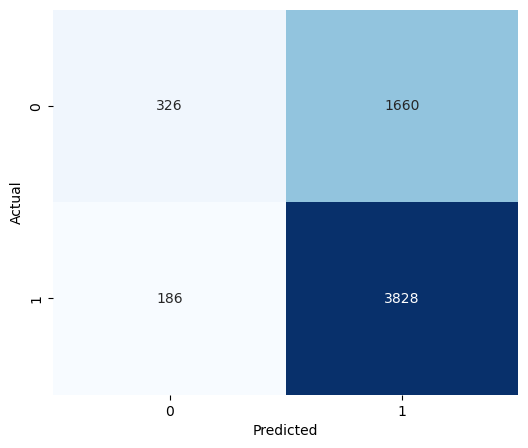

In [2589]:
plot_confusion_matrix(y_test,y_pred)

ROC-AUC Score for lr-model: 0.60


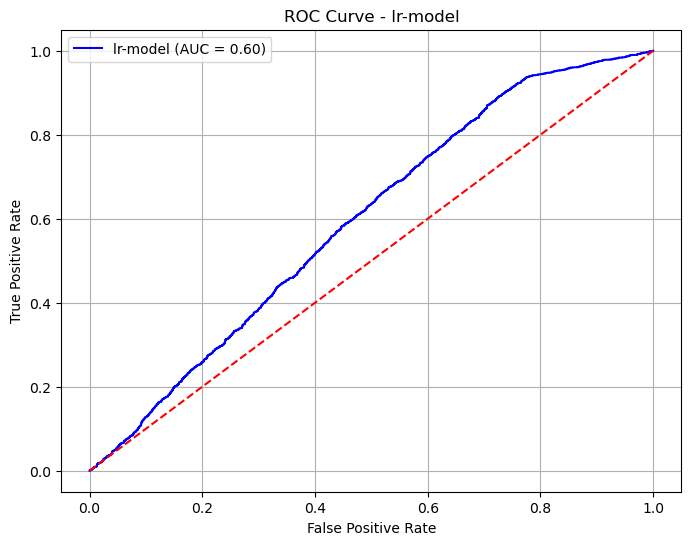

In [2591]:
plot_roc_curve(y_test,y_pred_proba,'lr-model')

In [2593]:
metrics(y_test,y_pred_cust,'threshold 0.4')

threshold 0.4
accuracy 0.669
precision 0.669
recall 1.0
fi score 0.8016776512881966
classification report               precision    recall  f1-score   support

           0       0.00      0.00      0.00      1986
           1       0.67      1.00      0.80      4014

    accuracy                           0.67      6000
   macro avg       0.33      0.50      0.40      6000
weighted avg       0.45      0.67      0.54      6000



## Decision Tree

In [2596]:
dt_model = DecisionTreeClassifier()
dt_model.fit(X_train, y_train)
train_pred=dt_model.predict(X_train)
y_pred = dt_model.predict(X_test)
y_pred_prob = dt_model.predict_proba(X_test)[:, 1]

In [2598]:
metrics(y_train,train_pred,'train metrics')

train metrics
accuracy 1.0
precision 1.0
recall 1.0
fi score 1.0
classification report               precision    recall  f1-score   support

           0       1.00      1.00      1.00      4977
           1       1.00      1.00      1.00      9023

    accuracy                           1.00     14000
   macro avg       1.00      1.00      1.00     14000
weighted avg       1.00      1.00      1.00     14000



In [2600]:
metrics(y_test,y_pred,'test metrics')

test metrics
accuracy 0.5728333333333333
precision 0.69290082424887
recall 0.6492277030393623
fi score 0.6703536977491962
classification report               precision    recall  f1-score   support

           0       0.37      0.42      0.39      1986
           1       0.69      0.65      0.67      4014

    accuracy                           0.57      6000
   macro avg       0.53      0.53      0.53      6000
weighted avg       0.59      0.57      0.58      6000



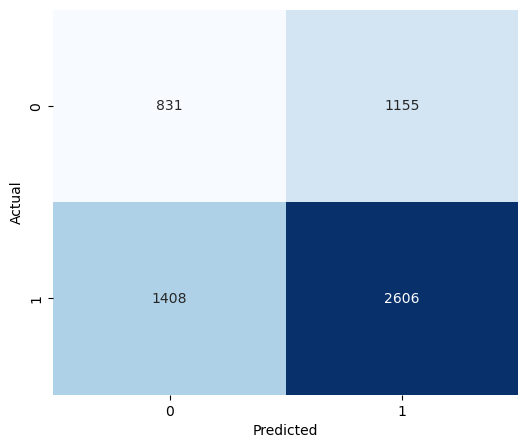

In [2602]:
plot_confusion_matrix(y_test,y_pred)

In [2604]:
#Tunned Dt

In [2606]:
param = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [3, 5, 10, 15, 20, None],
    'min_samples_split': [5, 10, 20, 50],
    'min_samples_leaf': [2, 4, 10]
}

In [2608]:
dt_serach=GridSearchCV(estimator=dt_model,param_grid=param,cv=5,n_jobs=-1,verbose=1)
model=dt_serach.fit(X_train,y_train)
print(model.best_params_)

Fitting 5 folds for each of 144 candidates, totalling 720 fits
{'criterion': 'entropy', 'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 5}


In [2610]:
dt_model = DecisionTreeClassifier(criterion='entropy',max_depth=3,min_samples_leaf=2,min_samples_split=5)
dt_model.fit(X_train, y_train)
train_pred=dt_model.predict(X_train)
y_pred = dt_model.predict(X_test)
y_pred_proba=dt_model.predict_proba(X_test)[:,1]

In [2612]:
metrics(y_train,train_pred,'train prediction')

train prediction
accuracy 0.6954285714285714
precision 0.695184972520712
recall 0.9392663194059625
fi score 0.799000659941548
classification report               precision    recall  f1-score   support

           0       0.70      0.25      0.37      4977
           1       0.70      0.94      0.80      9023

    accuracy                           0.70     14000
   macro avg       0.70      0.60      0.59     14000
weighted avg       0.70      0.70      0.65     14000



In [2614]:
metrics(y_test,y_pred,'Test prediction')

Test prediction
accuracy 0.7041666666666667
precision 0.7123079840697895
recall 0.9357249626307922
fi score 0.8088726176375579
classification report               precision    recall  f1-score   support

           0       0.65      0.24      0.35      1986
           1       0.71      0.94      0.81      4014

    accuracy                           0.70      6000
   macro avg       0.68      0.59      0.58      6000
weighted avg       0.69      0.70      0.66      6000



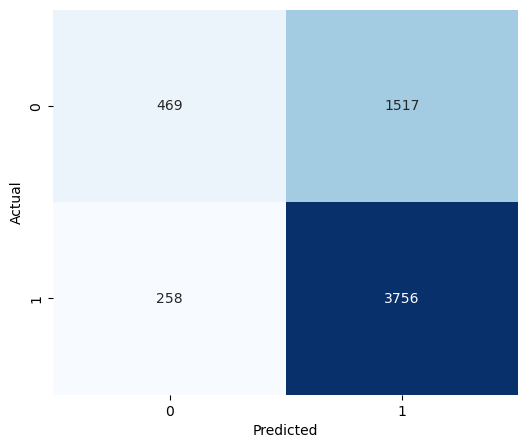

In [2616]:
plot_confusion_matrix(y_test,y_pred)

ROC-AUC Score for dt-model: 0.59


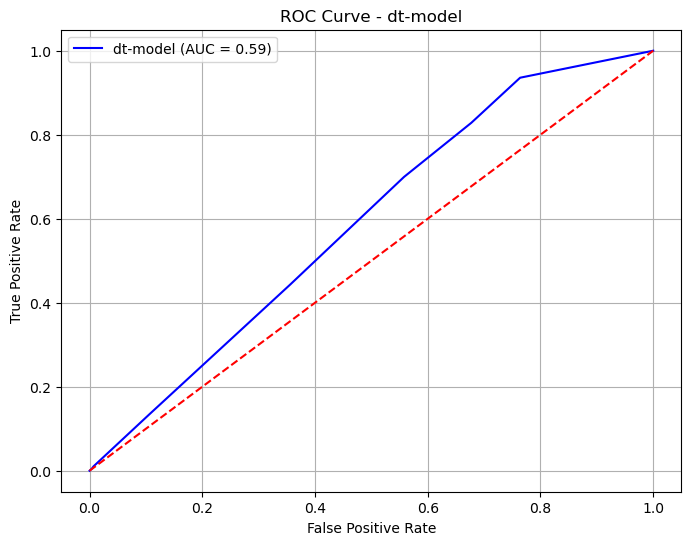

In [2618]:
plot_roc_curve(y_test,y_pred_proba,'dt-model')

## Random forest

In [2621]:
rf = RandomForestClassifier()
rf_model = rf.fit(X_train, y_train)
train_pred=rf_model.predict(X_train)
y_pred = rf_model.predict(X_test)
y_pred_proba = rf_model.predict_proba(X_test)[:,1]

In [2622]:
metrics(y_train, train_pred, 'train_metrics')

train_metrics
accuracy 1.0
precision 1.0
recall 1.0
fi score 1.0
classification report               precision    recall  f1-score   support

           0       1.00      1.00      1.00      4977
           1       1.00      1.00      1.00      9023

    accuracy                           1.00     14000
   macro avg       1.00      1.00      1.00     14000
weighted avg       1.00      1.00      1.00     14000



In [2623]:
metrics(y_test,y_pred,'test metrics')

test metrics
accuracy 0.6963333333333334
precision 0.7070268228182849
recall 0.93248629795715
fi score 0.804254404813064
classification report               precision    recall  f1-score   support

           0       0.62      0.22      0.32      1986
           1       0.71      0.93      0.80      4014

    accuracy                           0.70      6000
   macro avg       0.66      0.58      0.56      6000
weighted avg       0.68      0.70      0.65      6000



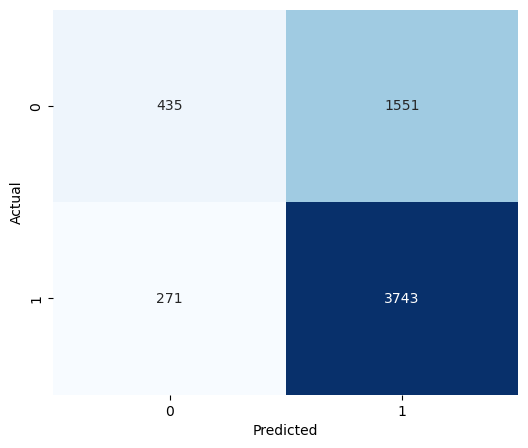

In [2627]:
plot_confusion_matrix(y_test,y_pred)

#### Tunning Random forest

In [1768]:
param = {
    'n_estimators': [100, 200],
    'max_depth': [10, 20, None],
    'min_samples_split': [2, 5],
    'class_weight': ['balanced']
}

In [1770]:
random_search = GridSearchCV(
    estimator=rf,
    param_grid=param,
    cv=5,
    verbose=1,
    n_jobs=-1
)
random_search.fit(X_train, y_train)
best_rf = random_search.best_estimator_
y_pred = best_rf.predict(X_test)
print("Best Params:", random_search.best_params_)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
Best Params: {'class_weight': 'balanced', 'max_depth': 20, 'min_samples_split': 5, 'n_estimators': 200}


In [2629]:
rf = RandomForestClassifier(class_weight='balanced',n_estimators=200,min_samples_split=5,random_state=42,max_depth=20)
rf_model = rf.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)
metrics(y_test, y_pred_rf, 'Random Forest')

Random Forest
accuracy 0.7
precision 0.7091836734693877
recall 0.9349775784753364
fi score 0.8065764023210832
classification report               precision    recall  f1-score   support

           0       0.63      0.23      0.33      1986
           1       0.71      0.93      0.81      4014

    accuracy                           0.70      6000
   macro avg       0.67      0.58      0.57      6000
weighted avg       0.68      0.70      0.65      6000



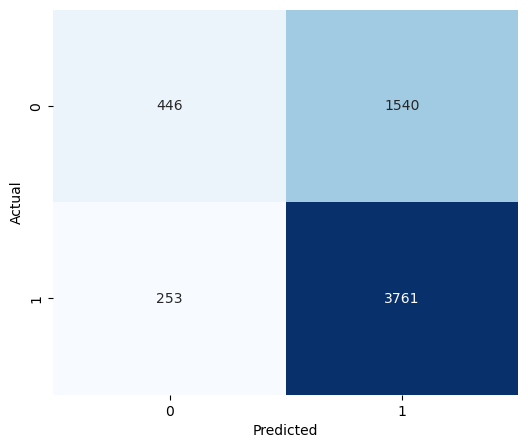

In [1762]:
plot_confusion_matrix(y_test,y_pred_rf)

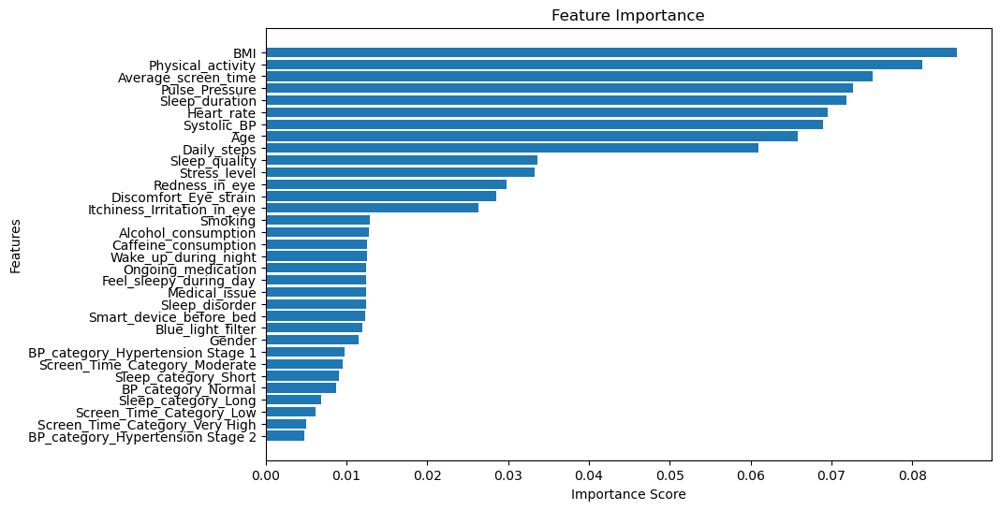

In [1739]:
imp_feature(rf)

## AdaBoost

In [2631]:
ada=AdaBoostClassifier(random_state=42)
ad_model=ada.fit(X_train,y_train)
y_pred=ad_model.predict(X_test)

In [2633]:
metrics(y_test,y_pred,'ad_model')

ad_model
accuracy 0.6903333333333334
precision 0.6953606379122871
recall 0.9559043348281017
fi score 0.8050776332354176
classification report               precision    recall  f1-score   support

           0       0.63      0.15      0.25      1986
           1       0.70      0.96      0.81      4014

    accuracy                           0.69      6000
   macro avg       0.66      0.55      0.53      6000
weighted avg       0.67      0.69      0.62      6000



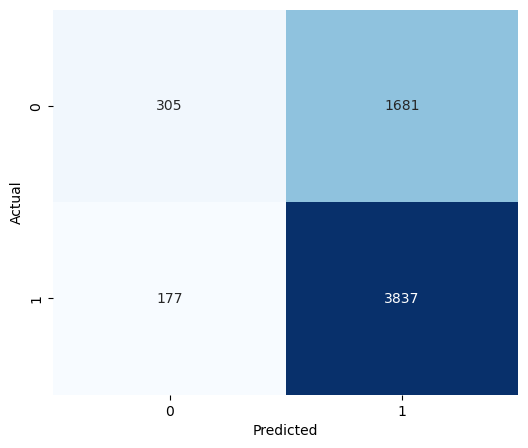

In [2635]:
plot_confusion_matrix(y_test,y_pred)

In [1532]:
#tunning ada boost

In [1986]:
base_dt=DecisionTreeClassifier()
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.5, 1],
    'algorithm': ['SAMME'],
    'estimator': [DecisionTreeClassifier(max_depth=1),
                  DecisionTreeClassifier(max_depth=2),
                  DecisionTreeClassifier(max_depth=3)]
}

In [1988]:
ada = AdaBoostClassifier(estimator=base_dt)
grid = GridSearchCV(estimator=ada, param_grid=params, cv=5, scoring='accuracy', n_jobs=-1)
grid.fit(X_train_sel, y_train)
print("Best Params:", grid.best_params_)

Best Params: {'algorithm': 'SAMME', 'estimator__max_depth': 2, 'learning_rate': 0.01, 'n_estimators': 50}


In [2637]:
ada=AdaBoostClassifier(estimator=DecisionTreeClassifier(max_depth=2),algorithm='SAMME',learning_rate=0.01,n_estimators=50,random_state=42)
ad_model=ada.fit(X_train,y_train)
y_pred=ad_model.predict(X_test)

In [2638]:
metrics(y_test,y_pred,'tunned_model')

tunned_model
accuracy 0.7041666666666667
precision 0.7123079840697895
recall 0.9357249626307922
fi score 0.8088726176375579
classification report               precision    recall  f1-score   support

           0       0.65      0.24      0.35      1986
           1       0.71      0.94      0.81      4014

    accuracy                           0.70      6000
   macro avg       0.68      0.59      0.58      6000
weighted avg       0.69      0.70      0.66      6000



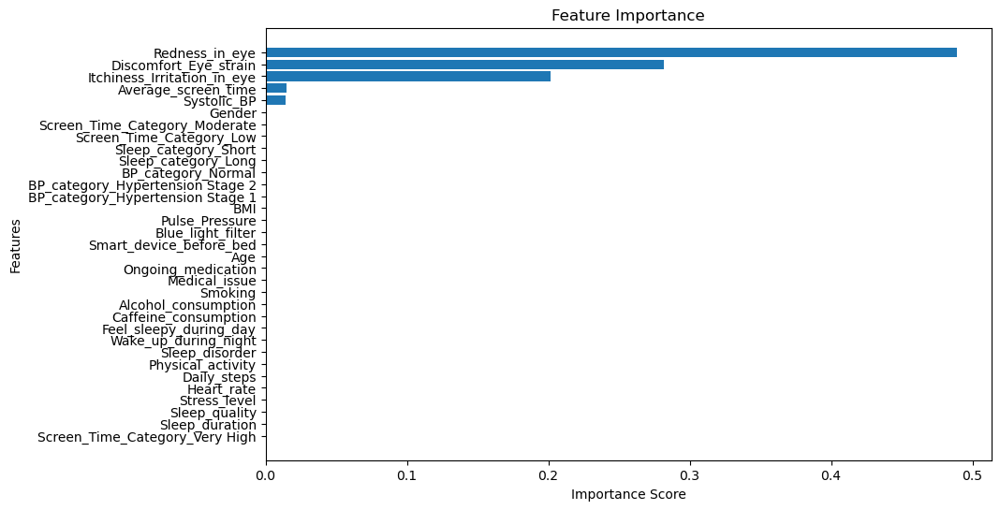

In [2641]:
imp_feature(ad_model)

## Gradient Boost

In [2643]:
gb = GradientBoostingClassifier()
gb.fit(X_train, y_train)
y_pred = gb.predict(X_test)

In [2644]:
metrics(y_test,y_pred,'GB_model')

GB_model
accuracy 0.7033333333333334
precision 0.7120349278663629
recall 0.9344793223716991
fi score 0.808230984701573
classification report               precision    recall  f1-score   support

           0       0.64      0.24      0.35      1986
           1       0.71      0.93      0.81      4014

    accuracy                           0.70      6000
   macro avg       0.68      0.59      0.58      6000
weighted avg       0.69      0.70      0.65      6000



In [1576]:
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'subsample': [0.8, 1.0],
    'max_features': ['sqrt', 'log2']
}

grid = GridSearchCV(estimator=gb, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid.fit(X_train, y_train)

print("Best Parameters:", grid.best_params_)
print("Best Score:", grid.best_score_)

Best Parameters: {'learning_rate': 0.01, 'max_depth': 7, 'max_features': 'log2', 'n_estimators': 300, 'subsample': 1.0}
Best Score: 0.6932857142857143


In [2647]:
gb = GradientBoostingClassifier(learning_rate=0.1,max_depth=3,max_features='log2',n_estimators=100,subsample=1.0,random_state=42)
gb.fit(X_train, y_train)
y_pred = gb.predict(X_test)

In [2648]:
metrics(y_test,y_pred,'GB-tunned')

GB-tunned
accuracy 0.7025
precision 0.7110395758379094
recall 0.9354758345789735
fi score 0.807961269499731
classification report               precision    recall  f1-score   support

           0       0.64      0.23      0.34      1986
           1       0.71      0.94      0.81      4014

    accuracy                           0.70      6000
   macro avg       0.68      0.58      0.57      6000
weighted avg       0.69      0.70      0.65      6000



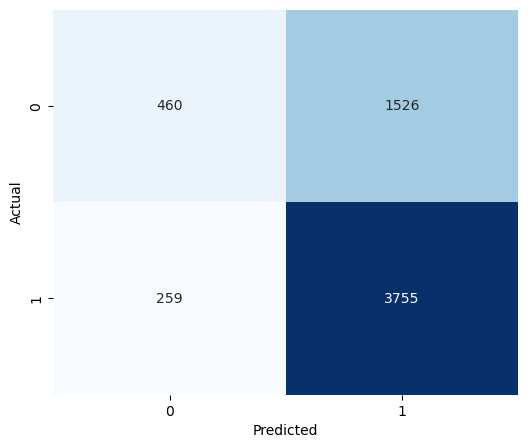

In [2651]:
plot_confusion_matrix(y_test,y_pred)

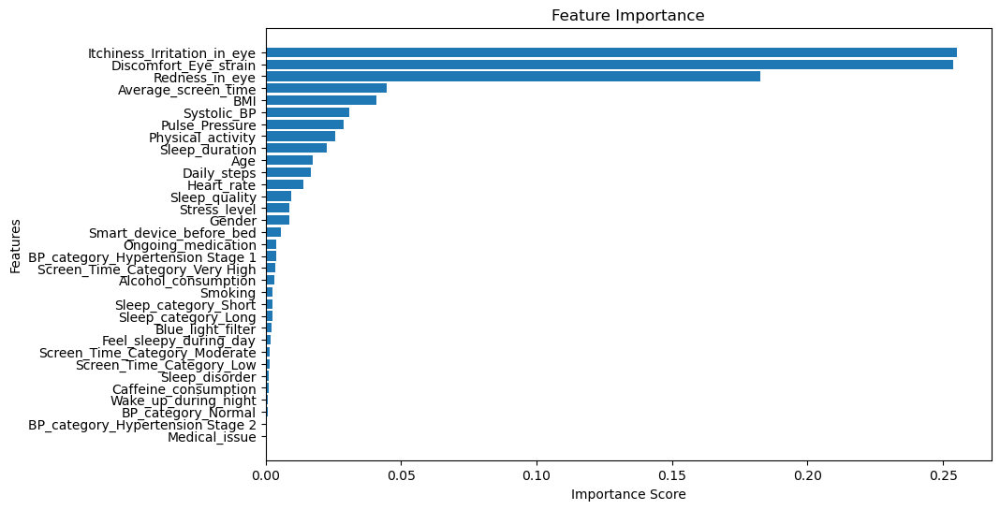

In [2653]:
imp_feature(gb)

## XGBOOST

In [2655]:
num_neg = sum(y_train == 0)
num_pos = sum(y_train == 1)

scale_pos_weight = num_pos/ num_neg
print("scale_pos_weight =", scale_pos_weight)

scale_pos_weight = 1.8129395218002813


In [2657]:
XGB = XGBClassifier()
xgb_model=XGB.fit(X_train, y_train)
y_pred = xgb_model.predict(X_test)

In [2659]:
metrics(y_test,y_pred,'XG-model')

XG-model
accuracy 0.6543333333333333
precision 0.7019991670137443
recall 0.8398106626806179
fi score 0.7647459165154264
classification report               precision    recall  f1-score   support

           0       0.46      0.28      0.35      1986
           1       0.70      0.84      0.76      4014

    accuracy                           0.65      6000
   macro avg       0.58      0.56      0.56      6000
weighted avg       0.62      0.65      0.63      6000



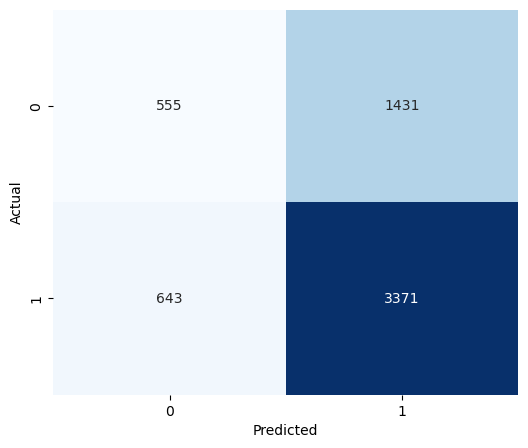

In [2661]:
plot_confusion_matrix(y_test,y_pred)

In [1013]:
param = {
    'n_estimators': [100, 200, 500],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 4, 5, 6],
    'min_child_weight': [1, 3, 5],
    'gamma': [0, 0.1, 0.5],
    'scale_pos_weight': [1, 2, 5] 
}

In [1015]:
grid_search = GridSearchCV(
    estimator=XGB,
    param_grid=param,
    scoring='recall',
    cv=5,
    verbose=2,
    n_jobs=-1
)

grid_search.fit(X_train, y_train)
print("Best Parameters:", grid_search.best_params_)

<IPython.core.display.Javascript object>

Fitting 5 folds for each of 1296 candidates, totalling 6480 fits
Best Parameters: {'gamma': 0, 'learning_rate': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'scale_pos_weight': 2}


In [2663]:
XGB = XGBClassifier(learning_rate=0.01,max_depth=3,min_child_weight=1,n_estimators=100,scale_pos_weight=1.81)
xgb_model=XGB.fit(X_train, y_train)
y_pred = xgb_model.predict(X_test)
y_pred_prob=xgb_model.predict_proba(X_test)[:,1]
y_pred_cust=(y_pred_prob>=0.7).astype(int)

In [2665]:
metrics(y_test,y_pred_cust,'tunned model')

tunned model
accuracy 0.7041666666666667
precision 0.7123079840697895
recall 0.9357249626307922
fi score 0.8088726176375579
classification report               precision    recall  f1-score   support

           0       0.65      0.24      0.35      1986
           1       0.71      0.94      0.81      4014

    accuracy                           0.70      6000
   macro avg       0.68      0.59      0.58      6000
weighted avg       0.69      0.70      0.66      6000



### Support Vector Machines (SVM)

In [2668]:
svm = SVC()
svm.fit(X_train, y_train)
y_pred = svm.predict(X_test)


In [2669]:
metrics(y_test,y_pred,'SVM_model')

SVM_model
accuracy 0.6935
precision 0.6992853216052777
recall 0.9506726457399103
fi score 0.80582831802344
classification report               precision    recall  f1-score   support

           0       0.64      0.17      0.27      1986
           1       0.70      0.95      0.81      4014

    accuracy                           0.69      6000
   macro avg       0.67      0.56      0.54      6000
weighted avg       0.68      0.69      0.63      6000



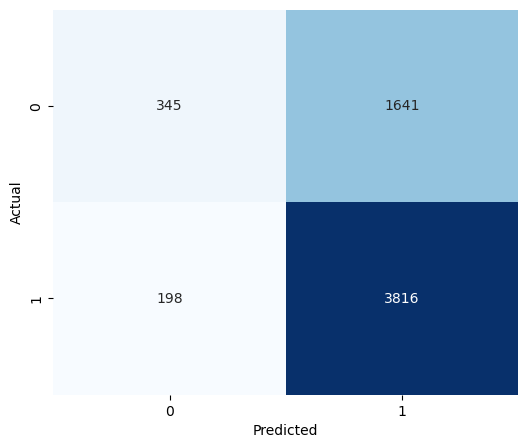

In [2670]:
plot_confusion_matrix(y_test,y_pred)

In [550]:
#tunned svm

In [501]:
param_grid = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf'],
    'gamma': ['scale', 'auto']
}

grid = GridSearchCV(svm, param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid.fit(X_train, y_train)

print("Best Parameters:", grid.best_params_)
print("Best Score:", grid.best_score_)

<IPython.core.display.Javascript object>

Best Parameters: {'C': 1, 'gamma': 'scale', 'kernel': 'rbf'}
Best Score: 0.6794285714285715


In [503]:
svm = SVC(C=1,gamma='scale',kernel='rbf')
svm.fit(X_train, y_train)
y_pred = svm.predict(X_test)

In [2674]:
metrics(y_test,y_pred,'tunned_svm')

tunned_svm
accuracy 0.6935
precision 0.6992853216052777
recall 0.9506726457399103
fi score 0.80582831802344
classification report               precision    recall  f1-score   support

           0       0.64      0.17      0.27      1986
           1       0.70      0.95      0.81      4014

    accuracy                           0.69      6000
   macro avg       0.67      0.56      0.54      6000
weighted avg       0.68      0.69      0.63      6000



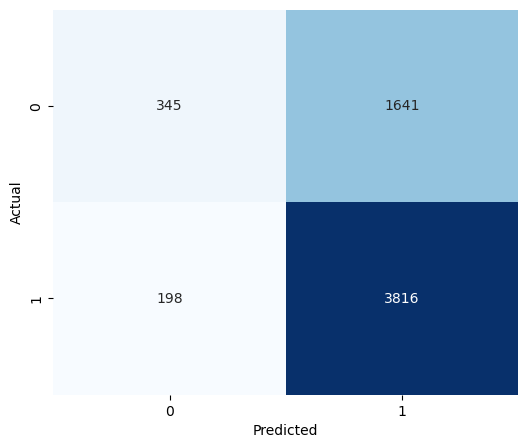

In [2676]:
plot_confusion_matrix(y_test,y_pred)

### Light GBM

In [2696]:
lgbm = LGBMClassifier()
lgbm.fit(X_train, y_train)
y_pred = lgbm.predict(X_test)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 9023, number of negative: 4977
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000508 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 873
[LightGBM] [Info] Number of data points in the train set: 14000, number of used features: 33
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.644500 -> initscore=0.594950
[LightGBM] [Info] Start training from score 0.594950


In [2704]:
metrics(y_test,y_pred,'LGBM')

LGBM
accuracy 0.6988333333333333
precision 0.7103106537068801
recall 0.9285002491280518
fi score 0.8048806824317029
classification report               precision    recall  f1-score   support

           0       0.62      0.23      0.34      1986
           1       0.71      0.93      0.80      4014

    accuracy                           0.70      6000
   macro avg       0.66      0.58      0.57      6000
weighted avg       0.68      0.70      0.65      6000



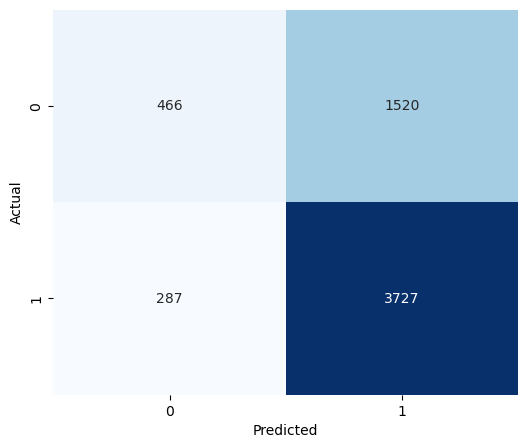

In [2700]:
plot_confusion_matrix(y_test,y_pred)

In [ ]:
#tunning

In [620]:
param_grid = {
    'n_estimators': [100, 200],
    'learning_rate': [0.01, 0.1],
    'max_depth': [5, 10, -1],
    'num_leaves': [31, 64],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid.fit(X_train, y_train)

print("Best Parameters:", grid.best_params_)
print("Best Score:", grid.best_score_)

<IPython.core.display.Javascript object>

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 9126, number of negative: 4874
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 659
[LightGBM] [Info] Number of data points in the train set: 14000, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.651857 -> initscore=0.627213
[LightGBM] [Info] Start training from score 0.627213
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

### shap values

<IPython.core.display.Javascript object>

 99%|===================| 5934/6000 [00:34<00:00]        

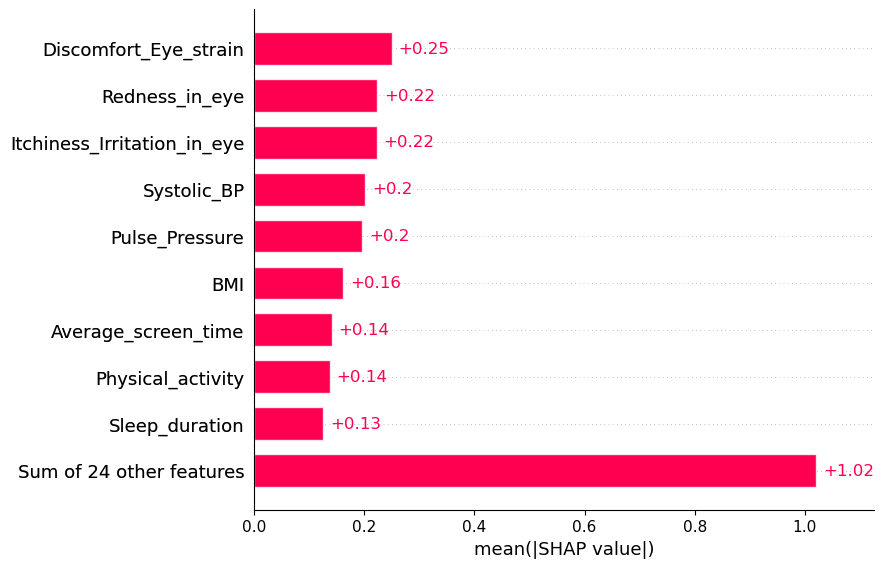

In [1021]:
import shap
model = xgb.XGBClassifier(eval_metric='logloss', use_label_encoder=False)
model.fit(X_train, y_train)

# SHAP Explainer
explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_test)

# Summary Plot (bar shows global feature importance)
shap.plots.bar(shap_values, max_display=10)

In [2357]:
# Models
models = [dt_model,rf, ada, gb, XGB, lgbm, svm]  # your pre-trained models
model_names = ['decision tree', 'random forest', 'Ada Boost', 'GradientBoost', 'XGBoost', 'Light GBM', 'Support Vector']


# Number of features to select
n_features_to_select = 30
for model, name in zip(models, model_names):
    # RFE Feature Selection
    rfe = RFE(estimator=model, n_features_to_select=n_features_to_select)
    rfe.fit(X_train, y_train)
    selected_features = X_train.columns[rfe.support_]
    print(f'{name}\n',selected_features)

decision tree
 Index(['Gender', 'Age', 'Sleep_duration', 'Sleep_quality', 'Stress_level',
       'Heart_rate', 'Daily_steps', 'Physical_activity', 'Sleep_disorder',
       'Wake_up_during_night', 'Feel_sleepy_during_day',
       'Caffeine_consumption', 'Alcohol_consumption', 'Smoking',
       'Medical_issue', 'Average_screen_time', 'Blue_light_filter',
       'Discomfort_Eye_strain', 'Redness_in_eye',
       'Itchiness_Irritation_in_eye', 'Systolic_BP', 'Diastolic_BP',
       'Pulse_Pressure', 'BMI', 'BP_category_Hypertension Stage 1',
       'BP_category_Hypertension Stage 2', 'BP_category_Normal',
       'Sleep_category_Long', 'Sleep_category_Short',
       'Screen_Time_Category_Low'],
      dtype='object')
random forest
 Index(['Gender', 'Age', 'Sleep_duration', 'Sleep_quality', 'Stress_level',
       'Heart_rate', 'Daily_steps', 'Physical_activity', 'Sleep_disorder',
       'Wake_up_during_night', 'Feel_sleepy_during_day',
       'Caffeine_consumption', 'Alcohol_consumption', 'Smok

ValueError: when `importance_getter=='auto'`, the underlying estimator SVC should have `coef_` or `feature_importances_` attribute. Either pass a fitted estimator to feature selector or call fit before calling transform.

In [ ]:
#Decision Tree on RFE features


In [2415]:
selected_features=['Gender', 'Age', 'Sleep_duration', 'Sleep_quality', 'Stress_level',
       'Heart_rate', 'Daily_steps', 'Physical_activity', 'Sleep_disorder',
       'Wake_up_during_night', 'Feel_sleepy_during_day',
       'Caffeine_consumption', 'Alcohol_consumption', 'Smoking',
       'Medical_issue', 'Average_screen_time', 'Blue_light_filter',
       'Discomfort_Eye_strain', 'Redness_in_eye',
       'Itchiness_Irritation_in_eye', 'Systolic_BP', 'Diastolic_BP',
       'Pulse_Pressure', 'BMI', 'BP_category_Hypertension Stage 1',
       'BP_category_Hypertension Stage 2', 'BP_category_Normal',
       'Sleep_category_Long', 'Sleep_category_Short',
       'Screen_Time_Category_Low']

In [2417]:
X_train_sel=X_train[selected_features]
X_test_sel=X_test[selected_features]

In [2435]:
dt_rfe = DecisionTreeClassifier()
dt_rfe.fit(X_train_sel, y_train)
train_pred=dt_rfe.predict(X_train_sel)
y_pred = dt_rfe.predict(X_test_sel)
y_pred_prob = dt_rfe.predict_proba(X_test_sel)[:, 1]

In [2437]:
metrics(y_train,train_pred,'train metrics')

train metrics
accuracy 1.0
precision 1.0
recall 1.0
fi score 1.0
classification report               precision    recall  f1-score   support

           0       1.00      1.00      1.00      4874
           1       1.00      1.00      1.00      9126

    accuracy                           1.00     14000
   macro avg       1.00      1.00      1.00     14000
weighted avg       1.00      1.00      1.00     14000



In [2439]:
metrics(y_test,y_pred,'test metrics')

test metrics
accuracy 0.5713333333333334
precision 0.676230586996578
recall 0.6568652518537459
fi score 0.6664072632944228
classification report               precision    recall  f1-score   support

           0       0.39      0.41      0.40      2089
           1       0.68      0.66      0.67      3911

    accuracy                           0.57      6000
   macro avg       0.53      0.53      0.53      6000
weighted avg       0.58      0.57      0.57      6000



In [2441]:
param = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [3, 5, 10, 15, 20, None],
    'min_samples_split': [5, 10, 20, 50],
    'min_samples_leaf': [2, 4, 10]
}

In [2443]:
dt_serach=GridSearchCV(estimator=dt_rfe,param_grid=param,cv=5,n_jobs=-1,verbose=1)
model=dt_serach.fit(X_train_sel,y_train)
print(model.best_params_)

Fitting 5 folds for each of 144 candidates, totalling 720 fits
{'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 5}


In [2471]:
dt_rfe = DecisionTreeClassifier(criterion='entropy',min_samples_leaf=2,min_samples_split=2,max_depth=4,random_state=42)
dt_rfe.fit(X_train_sel, y_train)
y_pred = dt_rfe.predict(X_test_sel)
metrics(y_test,y_pred,'dt rfe')

dt rfe
accuracy 0.6951666666666667
precision 0.7001923076923077
recall 0.9309639478394273
fi score 0.7992536494347492
classification report               precision    recall  f1-score   support

           0       0.66      0.25      0.37      2089
           1       0.70      0.93      0.80      3911

    accuracy                           0.70      6000
   macro avg       0.68      0.59      0.58      6000
weighted avg       0.69      0.70      0.65      6000



In [ ]:
# Random Forest

In [2473]:
rf_model_rfe = RandomForestClassifier(random_state=42)
rf_model_rfe.fit(X_train_sel, y_train)
y_pred_rf = rf_model_rfe.predict(X_test_sel)
y_pred_prob=rf_model_rfe.predict_proba(X_test_sel)[:,1]
y_pred_cust = (y_pred_prob > 0.35).astype(int)
metrics(y_test, y_pred, 'Random Forest')

Random Forest
accuracy 0.6951666666666667
precision 0.7001923076923077
recall 0.9309639478394273
fi score 0.7992536494347492
classification report               precision    recall  f1-score   support

           0       0.66      0.25      0.37      2089
           1       0.70      0.93      0.80      3911

    accuracy                           0.70      6000
   macro avg       0.68      0.59      0.58      6000
weighted avg       0.69      0.70      0.65      6000



In [2477]:
#ada boost
ada=AdaBoostClassifier(random_state=42)
ad_rfe=ada.fit(X_train_sel,y_train)
y_pred=ad_rfe.predict(X_test_sel)

In [2479]:
metrics(y_test,y_pred,'adaboost rfe')

adaboost rfe
accuracy 0.6758333333333333
precision 0.6761648745519713
recall 0.964714906673485
fi score 0.7950690127489201
classification report               precision    recall  f1-score   support

           0       0.67      0.13      0.22      2089
           1       0.68      0.96      0.80      3911

    accuracy                           0.68      6000
   macro avg       0.67      0.55      0.51      6000
weighted avg       0.67      0.68      0.60      6000



In [ ]:
#Gradient boost

In [ ]:
gb_rfe = GradientBoostingClassifier()
gb_rfe.fit(X_train_sel, y_train)
y_pred = gb_rfe.predict(X_test_sel)

In [2481]:
metrics(y_test,y_pred,'gradient boost rfe')

gradient boost rfe
accuracy 0.6758333333333333
precision 0.6761648745519713
recall 0.964714906673485
fi score 0.7950690127489201
classification report               precision    recall  f1-score   support

           0       0.67      0.13      0.22      2089
           1       0.68      0.96      0.80      3911

    accuracy                           0.68      6000
   macro avg       0.67      0.55      0.51      6000
weighted avg       0.67      0.68      0.60      6000



In [ ]:
# XGBoost

In [ ]:
XGB = XGBClassifier()
xgb_rfe=XGB.fit(X_train_sel, y_train)
y_pred = xgb_rfe.predict(X_test_sel)

In [2483]:
metrics(y_test,y_pred,'XGB rfe')

XGB rfe
accuracy 0.6758333333333333
precision 0.6761648745519713
recall 0.964714906673485
fi score 0.7950690127489201
classification report               precision    recall  f1-score   support

           0       0.67      0.13      0.22      2089
           1       0.68      0.96      0.80      3911

    accuracy                           0.68      6000
   macro avg       0.67      0.55      0.51      6000
weighted avg       0.67      0.68      0.60      6000



In [1370]:
metrics(y_test,y_pred,'shap xgb model')

shap xgb model
accuracy 0.6596666666666666
precision 0.7026304973284011
recall 0.8517688091679123
fi score 0.770045045045045
classification report               precision    recall  f1-score   support

           0       0.48      0.27      0.35      1986
           1       0.70      0.85      0.77      4014

    accuracy                           0.66      6000
   macro avg       0.59      0.56      0.56      6000
weighted avg       0.63      0.66      0.63      6000



In [1362]:
lr=LogisticRegression()
lr.fit(X_train,y_train)
y_pred=lr.predict(X_test)
y_pred_prob=lr.predict_proba(X_test)[:,1]
y_pred_cust = (y_pred_prob >= 0.55).astype(int)

<IPython.core.display.Javascript object>

In [1364]:
metrics(y_test,y_pred_cust,'l model')

l model
accuracy 0.7041666666666667
precision 0.7123079840697895
recall 0.9357249626307922
fi score 0.8088726176375579
classification report               precision    recall  f1-score   support

           0       0.65      0.24      0.35      1986
           1       0.71      0.94      0.81      4014

    accuracy                           0.70      6000
   macro avg       0.68      0.59      0.58      6000
weighted avg       0.69      0.70      0.66      6000



In [2684]:
voting_clf = VotingClassifier(estimators=[
    ('dt', dt_model),
    ('rf', rf),
    ('ada', ada),
    ('gb',gb),
    ('xgb', XGB),
    ('lbgm',lgbm),
], voting='soft')  # Use 'hard' for majority vote, 'soft' for probabilities

# Fit VotingClassifier
voting_clf.fit(X_train, y_train)

# Predict
y_pred_voting = voting_clf.predict(X_test)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 9023, number of negative: 4977
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000766 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 873
[LightGBM] [Info] Number of data points in the train set: 14000, number of used features: 33
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.644500 -> initscore=0.594950
[LightGBM] [Info] Start training from score 0.594950


In [2686]:
metrics(y_test,y_pred_voting,'voting')

voting
accuracy 0.7041666666666667
precision 0.7123079840697895
recall 0.9357249626307922
fi score 0.8088726176375579
classification report               precision    recall  f1-score   support

           0       0.65      0.24      0.35      1986
           1       0.71      0.94      0.81      4014

    accuracy                           0.70      6000
   macro avg       0.68      0.59      0.58      6000
weighted avg       0.69      0.70      0.66      6000



In [2706]:
def metric(y_test, y_pred, model):
    print(model)
    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred)
    rec = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    return acc, prec, rec, f1

In [2710]:
models = [
    ('Logistic Regression', lr_model),
    ('Decision Tree', dt_model),
    ('Random Forest', rf),
    ('Gradient Boosting', gb),
    ('XGBoost', XGB),
    ('LightGBM', lgbm),
    ('AdaBoost', ada),
    ('SVC', svm),
    ('Voting Classifier', voting_clf)
]
results = []

# Loop through models
for name, model in models:
    y_pred = model.predict(X_test)
    acc, prec, rec, f1 = metric(y_test, y_pred, name)
    
    results.append({
        'Model': name,
        'Accuracy': acc,
        'Precision': prec,
        'Recall': rec,
        'F1-Score': f1
    })

# Convert results to DataFrame
df_results = pd.DataFrame(results)
df_results

Logistic Regression
Decision Tree
Random Forest
Gradient Boosting
XGBoost
LightGBM
AdaBoost
SVC
Voting Classifier


,Model,Accuracy,Precision,Recall,F1-Score
0,Logistic Regression,0.692333,0.697522,0.953662,0.805725
1,Decision Tree,0.704167,0.712308,0.935725,0.808873
2,Random Forest,0.700000,0.709184,0.934978,0.806576
3,Gradient Boosting,0.702500,0.711040,0.935476,0.807961
4,XGBoost,0.669000,0.669000,1.000000,0.801678
5,LightGBM,0.698833,0.710311,0.928500,0.804881
6,AdaBoost,0.704167,0.712308,0.935725,0.808873
7,SVC,0.693500,0.699285,0.950673,0.805828
8,Voting Classifier,0.704167,0.712308,0.935725,0.808873


In [2712]:
df_results

,Model,Accuracy,Precision,Recall,F1-Score
0,Logistic Regression,0.692333,0.697522,0.953662,0.805725
1,Decision Tree,0.704167,0.712308,0.935725,0.808873
2,Random Forest,0.700000,0.709184,0.934978,0.806576
3,Gradient Boosting,0.702500,0.711040,0.935476,0.807961
4,XGBoost,0.669000,0.669000,1.000000,0.801678
5,LightGBM,0.698833,0.710311,0.928500,0.804881
6,AdaBoost,0.704167,0.712308,0.935725,0.808873
7,SVC,0.693500,0.699285,0.950673,0.805828
8,Voting Classifier,0.704167,0.712308,0.935725,0.808873
